<a href="https://colab.research.google.com/github/mili-who/Machine_learning_projects/blob/main/fifa_20_clustering.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# PRCP - 1004 - FIFA20

========================================================================================================================

## Problem Statement

**Task 1**:-Prepare a complete data analysis report on the given data.

**Task 2**:- Explore football skills and cluster football players based on their attributes.

**Task 3**:- Explore the data and attempt all the below asked questions in a step by step manner :

● Prepare a rank ordered list of top 10 countries with most players. Which countries are producing the most footballers that play at this level?

● Plot the distribution of overall rating vs. age of players. Interpret what is the age after which a player stops improving?

● Which type of offensive players tends to get paid the most: the striker, the right-winger, or the left-winger?




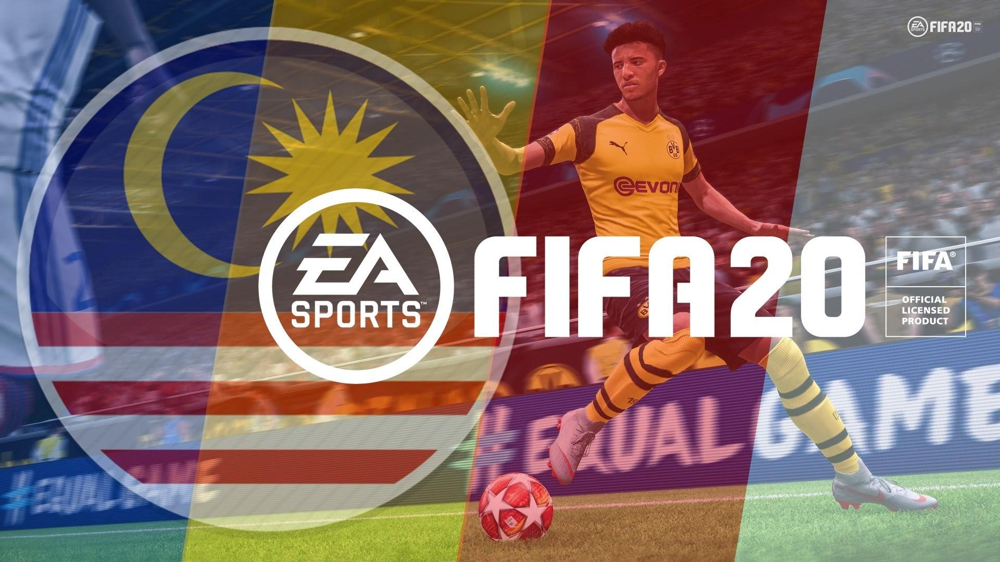

## CONTENTS :

1. Introduction
2. Objective
3. Basic Checks
    - Obtaining the data
    - Importing necessary libraries
    - Importing the dataset
4. Task - 1
    - Data Exploration (Understanding individual variables)
5. Statistical Analysis
6. Exploratory Data Analysis
    - Univariate analysis
    - Bivariate and Multivariate analysis
    - Visualizations of multiple variables
    - Figuring out patterns and trends in between individual columns
    - Task - 3
        * Top 10 countries with most players.
        * Interpretation of age after which players stop improving.
        * Comparison of wages for offensive players.
7. Task - 2 (Clustering)
    - Basic data moulding as needed for further analysis.
    - Feature Relevance
    - PCA
        * Feature Scaling
        * Transforming data for PCA
        * PCA analysis
    - K-Means Clustering
8. General Observations
9. Final Results with explanation
10. Interactive dashboard ( created using Microsoft PowerBI)

## INTRODUCTION -
Federation Internationale de Football Association, abbreviated as FIFA, is an international governing body of football, beach soccer and futsal. It was founded in the year 1904.

FIFA20 is a football simulation game, released each year by Electronic Arts Inc. The one we are working with, FIFA20, is the 27th installment and was released on 27 September 2019 for Microsoft Windows, PlayStation 4, Xbox One and Nintendo Switch. The main characters of this videogame are the football players. They are intended to be as close as the real players, both physically and in skills. The set of skills determine the position they play on the field.

It has amassed huge popularity since it was first released 20 years back. The game allows you to form teams of your choice and create rosters, which comes to life with the realistic animations.

## OBJECTIVE -
If you're a football fan, you are willing to know the position of your favorite player or team and the top 10 countries with most skilled players. Can a machine learn different player's or team's position based on their skills ? We will find that and let's try to answer some most common questions.

## OBTAINING THE DATA -
https://d3ilbtxij3aepc.cloudfront.net/projects/CDS-Capstone-Projects/PRCP-1004-
Fifa20.zip

### IMPORTING ALL NECESSARY LIBRARIES

In [ ]:
import pandas as pd
import numpy as np

import matplotlib.pyplot as plt
%matplotlib inline
import seaborn as sns
import plotly.express as px
import plotly.graph_objs as go
import plotly.offline as py
from plotly.offline import init_notebook_mode, iplot


import warnings
warnings.filterwarnings("ignore")

In [ ]:
pd.set_option("display.max_columns", 200)
pd.set_option('display.max_rows', 100)

### IMPORTING THE DATASET

In [ ]:
df = pd.read_csv("players_20.csv")
df.head()

,sofifa_id,player_url,short_name,long_name,age,dob,height_cm,weight_kg,nationality,club,overall,potential,value_eur,wage_eur,player_positions,preferred_foot,international_reputation,weak_foot,skill_moves,work_rate,body_type,real_face,release_clause_eur,player_tags,team_position,team_jersey_number,loaned_from,joined,contract_valid_until,nation_position,nation_jersey_number,pace,shooting,passing,dribbling,defending,physic,gk_diving,gk_handling,gk_kicking,gk_reflexes,gk_speed,gk_positioning,player_traits,attacking_crossing,attacking_finishing,attacking_heading_accuracy,attacking_short_passing,attacking_volleys,skill_dribbling,skill_curve,skill_fk_accuracy,skill_long_passing,skill_ball_control,movement_acceleration,movement_sprint_speed,movement_agility,movement_reactions,movement_balance,power_shot_power,power_jumping,power_stamina,power_strength,power_long_shots,mentality_aggression,mentality_interceptions,mentality_positioning,mentality_vision,mentality_penalties,mentality_composure,defending_marking,defending_standing_tackle,defending_sliding_tackle,goalkeeping_diving,goalkeeping_handling,goalkeeping_kicking,goalkeeping_positioning,goalkeeping_reflexes,ls,st,rs,lw,lf,cf,rf,rw,lam,cam,ram,lm,lcm,cm,rcm,rm,lwb,ldm,cdm,rdm,rwb,lb,lcb,cb,rcb,rb
0,158023,https://sofifa.com/player/158023/lionel-messi/...,L. Messi,Lionel Andrés Messi Cuccittini,32,1987-06-24,170,72,Argentina,FC Barcelona,94,94,95500000,565000,"RW, CF, ST",Left,5,4,4,Medium/Low,Messi,Yes,195800000.0,"#Dribbler, #Distance Shooter, #Crosser, #FK Sp...",RW,10.0,NaN,2004-07-01,2021.0,NaN,NaN,87.0,92.0,92.0,96.0,39.0,66.0,NaN,NaN,NaN,NaN,NaN,NaN,"Beat Offside Trap, Argues with Officials, Earl...",88,95,70,92,88,97,93,94,92,96,91,84,93,95,95,86,68,75,68,94,48,40,94,94,75,96,33,37,26,6,11,15,14,8,89+2,89+2,89+2,93+2,93+2,93+2,93+2,93+2,93+2,93+2,93+2,92+2,87+2,87+2,87+2,92+2,68+2,66+2,66+2,66+2,68+2,63+2,52+2,52+2,52+2,63+2
1,20801,https://sofifa.com/player/20801/c-ronaldo-dos-...,Cristiano Ronaldo,Cristiano Ronaldo dos Santos Aveiro,34,1985-02-05,187,83,Portugal,Juventus,93,93,58500000,405000,"ST, LW",Right,5,4,5,High/Low,C. Ronaldo,Yes,96500000.0,"#Speedster, #Dribbler, #Distance Shooter, #Acr...",LW,7.0,NaN,2018-07-10,2022.0,LS,7.0,90.0,93.0,82.0,89.0,35.0,78.0,NaN,NaN,NaN,NaN,NaN,NaN,"Long Throw-in, Selfish, Argues with Officials,...",84,94,89,83,87,89,81,76,77,92,89,91,87,96,71,95,95,85,78,93,63,29,95,82,85,95,28,32,24,7,11,15,14,11,91+3,91+3,91+3,89+3,90+3,90+3,90+3,89+3,88+3,88+3,88+3,88+3,81+3,81+3,81+3,88+3,65+3,61+3,61+3,61+3,65+3,61+3,53+3,53+3,53+3,61+3
2,190871,https://sofifa.com/player/190871/neymar-da-sil...,Neymar Jr,Neymar da Silva Santos Junior,27,1992-02-05,175,68,Brazil,Paris Saint-Germain,92,92,105500000,290000,"LW, CAM",Right,5,5,5,High/Medium,Neymar,Yes,195200000.0,"#Speedster, #Dribbler, #Playmaker , #Crosser,...",CAM,10.0,NaN,2017-08-03,2022.0,LW,10.0,91.0,85.0,87.0,95.0,32.0,58.0,NaN,NaN,NaN,NaN,NaN,NaN,"Power Free-Kick, Injury Free, Selfish, Early C...",87,87,62,87,87,96,88,87,81,95,94,89,96,92,84,80,61,81,49,84,51,36,87,90,90,94,27,26,29,9,9,15,15,11,84+3,84+3,84+3,90+3,89+3,89+3,89+3,90+3,90+3,90+3,90+3,89+3,82+3,82+3,82+3,89+3,66+3,61+3,61+3,61+3,66+3,61+3,46+3,46+3,46+3,61+3
3,200389,https://sofifa.com/player/200389/jan-oblak/20/...,J. Oblak,Jan Oblak,26,1993-01-07,188,87,Slovenia,Atlético Madrid,91,93,77500000,125000,GK,Right,3,3,1,Medium/Medium,Normal,Yes,164700000.0,NaN,GK,13.0,NaN,2014-07-16,2023.0,GK,1.0,NaN,NaN,NaN,NaN,NaN,NaN,87.0,92.0,78.0,89.0,52.0,90.0,"Flair, Acrobatic Clearance",13,11,15,43,13,12,13,14,40,30,43,60,67,88,49,59,78,41,78,12,34,19,11,65,11,68,27,12,18,87,92,78,90,89,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,183277,https://sofifa.com/player/183277/eden-hazard/2...,E. Hazard,Eden Hazard,28,1991-01-07,175,74,Belgium,Real Madrid,91,91,90000000,470000,"LW, CF",Right,4,4,4,High/Medium,Normal,Yes,184500000.0,"#Speedster, #Dribbler, #Acrobat",LW,7.0,NaN,2019-07-01,

## TASK - 1

### DATA EXPLORATION

## ABOUT THE DATASET



1. sofifa_id: Unique identifier for each player in the SOFIFA database.

2. player_url: URL to the player's profile page on SOFIFA.

3. short_name: Shortened name of the player.

4. long_name: Full name of the player.

5. age: Age of the player.

6. dob: Date of birth of the player.

7. height_cm: Height of the player in centimeters.

8. weight_kg: Weight of the player in kilograms.

9. nationality: Nationality of the player.

10. club: Current club of the player.

11. overall: Overall rating of the player's skills and abilities.

12. potential: Potential rating of how much the player's skills can improve.

13. value_eur: Estimated market value of the player in Euros.

14. wage_eur: Weekly wage of the player in Euros.

15. player_positions: Positions on the field that the player can play in.

16. preferred_foot: Preferred foot for kicking (left or right).

17. international_reputation: Player's international reputation level.

18. weak_foot: Skill level of the player's weaker foot.

19. skill_moves: Skill moves rating of the player.

20. work_rate: Player's work rate on the field.

21. body_type: Player's body type.

22. real_face: Whether the player has a real face in the game.

23. release_clause_eur: Release clause value in Euros.  

24. player_tags: Tags or labels associated with the player for categorization.

25. team_position: The player's position within their current team.

26. team_jersey_number: The jersey number the player wears for their current team.

27. loaned_from: The club from which the player is currently on loan.

28. joined: Date when the player joined their current club.

29. contract_valid_until: Date when the player's contract with the current club expires.

30. nation_position: The player's position within their national team.

31. nation_jersey_number: The jersey number the player wears for their national team.

32.  Pace, Shooting, Passing,Dribbling, Defending, Physic are various attributes related to player.

33. 'gk_diving', 'gk_handling', 'gk_kicking', 'gk_reflexes', 'gk_speed' and 'gk_positioning' are various attributes related to goalkeeping skills.

34. player_traits: Traits associated with the player's playing style and characteristics.

35. 'attacking_crossing', 'attacking_finishing', 'attacking_heading_accuracy','attacking_short_passing', 'attacking_volleys' are attributes related to attacking skills.

36. 'skill_dribbling', 'skill_curve', 'skill_fk_accuracy', 'skill_long_passing' and 'skill_ball_control' are skill moves of the player.

37. 'movement_acceleration','movement_sprint_speed','movement_agility','movement_reactions','movement_balance','power_shot_power','power_jumping',
'power_stamina','power_strength','power_long_shots' are various attributes related to player's movement and stamina.

38. 'mentality_aggression','mentality_interceptions','mentality_positioning','mentality_vision','mentality_penalties','mentality_composure','defending_marking','defending_standing_tackle' and 'defending_sliding_tackle' are various attributes related to player's mentality and defending skills.

39. 'goalkeeping_diving', 'goalkeeping_handling', 'goalkeeping_kicking',
 'goalkeeping_positioning' and 'goalkeeping_reflexes' are goalkeeper's skills.

40. 'ls', 'st', 'rs', 'lw', 'lf', 'cf', 'rf', 'rw', 'lam', 'cam', 'ram', 'lm',
 'lcm', 'cm', 'rcm', 'rm', 'lwb', 'ldm', 'cdm', 'rdm','rwb', 'lb', 'lcb', 'cb',
 'rcb' and 'rb' are the various positions the players can play on the field.


In [ ]:
df.info(5)

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 18278 entries, 0 to 18277
Data columns (total 104 columns):
 #    Column                      Dtype  
---   ------                      -----  
 0    sofifa_id                   int64  
 1    player_url                  object 
 2    short_name                  object 
 3    long_name                   object 
 4    age                         int64  
 5    dob                         object 
 6    height_cm                   int64  
 7    weight_kg                   int64  
 8    nationality                 object 
 9    club                        object 
 10   overall                     int64  
 11   potential                   int64  
 12   value_eur                   int64  
 13   wage_eur                    int64  
 14   player_positions            object 
 15   preferred_foot              object 
 16   international_reputation    int64  
 17   weak_foot                   int64  
 18   skill_moves                 int64  
 19   wo

In [ ]:
print("The number of rows is :",df.shape[0])
print("The number of columns is :",df.shape[1])

The number of rows is : 18278
The number of columns is : 104


## TYPES OF VARIABLES -

1. Numeric columns - 59


> Age, height_cm, weight_kg, overall, potential, value_eur, wage_eur, international_reputation, weak_foot, skill_moves, release_clause_eur, team_jersey_number, nation_jersey_number

> pace, shooting, passing, dribbling, defending, physic, gk_diving, gk_handling, gk_kicking, gk_reflexes, gk_speed, gk_positioning, attacking_crossing, attacking_finishing, attacking_heading_accuracy, attacking_short_passing, attacking_volleys

> skill_dribbling, skill_curve,	skill_fk_accuracy,	skill_long_passing,	skill_ball_control,movement_acceleration,	movement_sprint_speed	movement_agility, movement_reactions,	movement_balance,

> power_shot_power,	power_jumping,	power_stamina,	power_strength,	power_long_shots,	mentality_aggression,	mentality_interceptions,	mentality_positioning,	mentality_vision,	mentality_penalties,	mentality_composure,

> defending_marking,	defending_standing_tackle,	defending_sliding_tackle,	goalkeeping_diving,	goalkeeping_handling,	goalkeeping_kicking,	goalkeeping_positioning,	goalkeeping_reflexes


2. Categorical columns - 40


> short_name, long_name, nationality, club, player_positions, preferred_foot, work_rate, body_type, real_face, player_tags, team_position, loaned_from,  nation_position, player_traits, ls, st, rs, lw, lf, cf, rf, rw,lam, cam, ram, lm, lcm, cm, rcm, rm,lwb, ldm, cdm, rdm, rwb, lb, lcb, cb, rcb, rb


3. URL column - 1


> player_url


4. Text columns - 1


> player_traits


5. DateTime columns - 2


> dob, joined

6. Boolean column - 1


> real_face



In [ ]:
for i in df.describe(include = "all"):
  print(i)
  print(df[i].unique())
  print(" " * 30)

sofifa_id
[158023  20801 190871 ... 252332 251110 233449]
                              
player_url
['https://sofifa.com/player/158023/lionel-messi/20/159586'
 'https://sofifa.com/player/20801/c-ronaldo-dos-santos-aveiro/20/159586'
 'https://sofifa.com/player/190871/neymar-da-silva-santos-jr/20/159586'
 ... 'https://sofifa.com/player/252332/wei-zhang/20/159586'
 'https://sofifa.com/player/251110/haijian-wang/20/159586'
 'https://sofifa.com/player/233449/ximing-pan/20/159586']
                              
short_name
['L. Messi' 'Cristiano Ronaldo' 'Neymar Jr' ... 'Xiao Mingjie'
 'Wang Haijian' 'Pan Ximing']
                              
long_name
['Lionel Andrés Messi Cuccittini' 'Cristiano Ronaldo dos Santos Aveiro'
 'Neymar da Silva Santos Junior' ... '张威' '汪海健' '潘喜明']
                              
age
[32 34 27 26 28 33 20 25 31 30 24 29 23 19 22 37 36 21 41 38 35 18 40 39
 17 16 42]
                              
dob
['1987-06-24' '1985-02-05' '1992-02-05' ... '1999-12-14' '1997

In [ ]:
list(df.columns)

['sofifa_id',
 'player_url',
 'short_name',
 'long_name',
 'age',
 'dob',
 'height_cm',
 'weight_kg',
 'nationality',
 'club',
 'overall',
 'potential',
 'value_eur',
 'wage_eur',
 'player_positions',
 'preferred_foot',
 'international_reputation',
 'weak_foot',
 'skill_moves',
 'work_rate',
 'body_type',
 'real_face',
 'release_clause_eur',
 'player_tags',
 'team_position',
 'team_jersey_number',
 'loaned_from',
 'joined',
 'contract_valid_until',
 'nation_position',
 'nation_jersey_number',
 'pace',
 'shooting',
 'passing',
 'dribbling',
 'defending',
 'physic',
 'gk_diving',
 'gk_handling',
 'gk_kicking',
 'gk_reflexes',
 'gk_speed',
 'gk_positioning',
 'player_traits',
 'attacking_crossing',
 'attacking_finishing',
 'attacking_heading_accuracy',
 'attacking_short_passing',
 'attacking_volleys',
 'skill_dribbling',
 'skill_curve',
 'skill_fk_accuracy',
 'skill_long_passing',
 'skill_ball_control',
 'movement_acceleration',
 'movement_sprint_speed',
 'movement_agility',
 'movement_re

In [ ]:
cols_to_convert = ['sofifa_id',
  'age',
 'height_cm',
 'weight_kg',
 'value_eur',
 'wage_eur',
 'attacking_crossing',
 'attacking_finishing',
 'attacking_heading_accuracy',
 'attacking_short_passing',
 'attacking_volleys',
 'skill_dribbling',
 'skill_curve',
 'skill_fk_accuracy',
 'skill_long_passing',
 'skill_ball_control',
 'movement_acceleration',
 'movement_sprint_speed',
 'movement_agility',
 'movement_reactions',
 'movement_balance',
 'power_shot_power',
 'power_jumping',
 'power_stamina',
 'power_strength',
 'power_long_shots',
 'mentality_aggression',
 'mentality_interceptions',
 'mentality_positioning',
 'mentality_vision',
 'mentality_penalties',
 'mentality_composure',
 'defending_marking',
 'defending_standing_tackle',
 'defending_sliding_tackle',
 'goalkeeping_diving',
 'goalkeeping_handling',
 'goalkeeping_kicking',
 'goalkeeping_positioning',
 'goalkeeping_reflexes'      ]

In [ ]:
df[cols_to_convert] = df[cols_to_convert].astype('int16')

In [ ]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 18278 entries, 0 to 18277
Columns: 104 entries, sofifa_id to rb
dtypes: float64(16), int16(40), int64(5), object(43)
memory usage: 10.3+ MB


## STATISTICAL ANALYSIS

In [ ]:
df.describe()

,sofifa_id,age,height_cm,weight_kg,overall,potential,value_eur,wage_eur,international_reputation,weak_foot,skill_moves,release_clause_eur,team_jersey_number,contract_valid_until,nation_jersey_number,pace,shooting,passing,dribbling,defending,physic,gk_diving,gk_handling,gk_kicking,gk_reflexes,gk_speed,gk_positioning,attacking_crossing,attacking_finishing,attacking_heading_accuracy,attacking_short_passing,attacking_volleys,skill_dribbling,skill_curve,skill_fk_accuracy,skill_long_passing,skill_ball_control,movement_acceleration,movement_sprint_speed,movement_agility,movement_reactions,movement_balance,power_shot_power,power_jumping,power_stamina,power_strength,power_long_shots,mentality_aggression,mentality_interceptions,mentality_positioning,mentality_vision,mentality_penalties,mentality_composure,defending_marking,defending_standing_tackle,defending_sliding_tackle,goalkeeping_diving,goalkeeping_handling,goalkeeping_kicking,goalkeeping_positioning,goalkeeping_reflexes
count,18278.000000,18278.000000,18278.000000,18278.000000,18278.000000,18278.000000,18278.000000,18278.000000,18278.000000,18278.000000,18278.000000,1.698000e+04,18038.000000,18038.000000,1126.000000,16242.000000,16242.000000,16242.000000,16242.000000,16242.000000,16242.000000,2036.000000,2036.000000,2036.000000,2036.000000,2036.000000,2036.000000,18278.000000,18278.000000,18278.000000,18278.000000,18278.000000,18278.000000,18278.000000,18278.000000,18278.000000,18278.000000,18278.000000,18278.000000,18278.000000,18278.000000,18278.000000,18278.000000,18278.000000,18278.000000,18278.000000,18278.000000,18278.000000,18278.000000,18278.000000,18278.000000,18278.000000,18278.000000,18278.000000,18278.000000,18278.000000,18278.000000,18278.000000,18278.000000,18278.000000,18278.000000
mean,-4409.458092,25.283291,181.362184,75.276343,66.244994,71.546887,729.515264,4326.074188,1.103184,2.944250,2.368038,4.740717e+06,20.103892,2021.114591,12.114565,67.700899,52.298301,57.233777,62.531585,51.553503,64.876678,65.422397,63.146365,61.832515,66.390472,37.798625,63.374754,49.718405,45.590218,52.221468,58.748003,42.809388,55.596509,47.325692,42.708885,52.768848,58.461976,64.299923,64.415746,63.504924,61.752544,63.856439,58.181694,64.928165,62.889485,65.234763,46.812945,55.742149,46.380239,50.072163,53.609749,48.383357,58.528778,46.848889,47.640333,45.606631,16.572765,16.354853,16.212934,16.368038,16.709924
std,19733.359317,4.656964,6.756961,7.047744,6.949953,6.139669,18578.967316,8806.969654,0.378861,0.664656,0.765038,1.103002e+07,16.603639,1.289888,6.735922,11.297656,14.029418,10.407844,10.284950,16.419528,9.760162,7.736278,7.244023,7.510709,8.154062,10.634038,8.447876,18.325403,19.594609,17.428429,14.679653,17.701815,18.929118,18.422991,17.433612,15.246454,16.741878,15.042232,14.847763,14.808380,9.135613,14.201559,13.326083,11.934059,16.017954,12.534811,19.322343,17.318157,20.775812,19.594022,13.955626,15.708099,11.880840,20.091287,21.585641,21.217734,17.738069,16.996925,16.613665,17.136497,18.038125
min,-32765.000000,16.000000,156.000000,50.000000,48.000000,49.000000,-32448.000000,-32536.000000,1.000000,1.000000,1.000000,1.300000e+04,1.000000,2019.000000,1.000000,24.000000,15.000000,24.000000,23.000000,15.000000,27.000000,44.000000,42.000000,35.000000,45.000000,12.000000,41.000000,5.000000,2.000000,5.000000,7.000000,3.000000,4.000000,6.000000,4.000000,8.000000,5.000000,12.000000,11.000000,11.000000,21.000000,12.000000,14.000000,19.000000,12.000000,20.000000,4.000000,9.000000,3.000000,2.000000,9.000000,7.000000,12.000000,1.000000,5.000000,3.000000,1.000000,1.000000,1.000000,1.000000,1.000000
25%,-20682.750000,22.000000,177.000000,70.000000,62.000000,67.000000,-14656.000000,1000.000000,1.000000,3.000000,2.000000,5.630000e+05,9.000000,2020.000000,6.000000,61.000000,42.000000,50.000000,57.000000,36.000000,59.000000,60.000000,58.000000,57.000000,60.750000,29.000000,58.000000,38.000000,30.000000,44.000000,54.000000,30.000000,50.000000,34.000000,31.000000,43.000000,54.000000,56.0000

In [ ]:
df.describe(include = 'O')

,player_url,short_name,long_name,dob,nationality,club,player_positions,preferred_foot,work_rate,body_type,real_face,player_tags,team_position,loaned_from,joined,nation_position,player_traits,ls,st,rs,lw,lf,cf,rf,rw,lam,cam,ram,lm,lcm,cm,rcm,rm,lwb,ldm,cdm,rdm,rwb,lb,lcb,cb,rcb,rb
count,18278,18278,18278,18278,18278,18278,18278,18278,18278,18278,18278,1499,18038,1048,16990,1126,7566,16242,16242,16242,16242,16242,16242,16242,16242,16242,16242,16242,16242,16242,16242,16242,16242,16242,16242,16242,16242,16242,16242,16242,16242,16242,16242
unique,18278,17354,18218,6142,162,698,643,2,9,10,2,83,29,316,1760,26,921,94,94,94,107,103,103,103,107,103,103,103,100,88,88,88,100,98,98,98,98,98,96,110,110,110,96
top,https://sofifa.com/player/158023/lionel-messi/...,J. Rodríguez,Liam Kelly,1992-02-29,England,FC Barcelona,CB,Right,Medium/Medium,Normal,No,#Strength,SUB,Sassuolo,2019-07-01,SUB,Early Crosser,61+2,61+2,61+2,63+2,63+2,63+2,63+2,63+2,61+2,61+2,61+2,61+2,58+2,58+2,58+2,61+2,59+2,59+2,59+2,59+2,59+2,61+2,63+2,63+2,63+2,61+2
freq,1,11,3,113,1667,33,2322,13960,9875,10750,16310,514,7820,17,1465,587,501,725,725,725,736,727,727,727,736,748,748,748,809,775,775,775,809,682,636,636,636,682,667,621,621,621,667


In [ ]:
numerical_columns = df.select_dtypes(include = ['int16', 'int64', 'float64'])

skewness = numerical_columns.skew()
kurtosis = numerical_columns.kurtosis()

data = pd.DataFrame({'Skewness' : skewness, 'Kurtosis' : kurtosis})
print(data)

                            Skewness   Kurtosis
sofifa_id                   0.404867  -1.193772
age                         0.380620  -0.531366
height_cm                  -0.038197  -0.303462
weight_kg                   0.220802   0.041651
overall                     0.070893   0.057616
potential                   0.249941  -0.018895
value_eur                  -0.013846  -1.155271
wage_eur                   -0.387061   4.708453
international_reputation    4.296515  21.285867
weak_foot                   0.162986   0.638376
skill_moves                 0.173640  -0.114946
release_clause_eur          6.460916  62.702644
team_jersey_number          2.126464   6.444938
contract_valid_until        0.505437  -0.472331
nation_jersey_number        0.026385  -1.139391
pace                       -0.547591   0.567073
shooting                   -0.291508  -0.755957
passing                    -0.238299  -0.128325
dribbling                  -0.607985   0.474013
defending                  -0.342479  -1

In [ ]:
missing_percent = (df.isnull().sum() / len(df)) * 100

missing_info = pd.DataFrame({'Columns' : df.columns, 'Missing_percentage' : missing_percent})

cols_with_missing = missing_info[missing_info['Missing_percentage'] > 0]

print(cols_with_missing)

                                   Columns  Missing_percentage
release_clause_eur      release_clause_eur            7.101433
player_tags                    player_tags           91.798884
team_position                team_position            1.313054
team_jersey_number      team_jersey_number            1.313054
loaned_from                    loaned_from           94.266331
joined                              joined            7.046723
contract_valid_until  contract_valid_until            1.313054
nation_position            nation_position           93.839589
nation_jersey_number  nation_jersey_number           93.839589
pace                                  pace           11.139074
shooting                          shooting           11.139074
passing                            passing           11.139074
dribbling                        dribbling           11.139074
defending                        defending           11.139074
physic                              physic           11

Some of the columns like 'loaned_from', 'player_tags', nation_position' , etc. have very high amount of missing values.Besides them, several of the columns have missing values.

##  Exploratory Data Analysis -

We hope to uncover new information from the *sofifa* dataset. We aim to create groups of positions such as attackers, defenders, goalkeepers, etc. and we intend to dig out information and trends in these variables.

We start by answering some of the questions which we think are pretty common. We must first subset our data to contain only those features which are relevant to us, such as player's attributes, wage, skill moves and value.

## 1. UNIVARIATE ANALYSIS

In [ ]:
# Install sweetviz
#!pip install sweetviz


In [ ]:
import sweetviz

In [ ]:
def convert_scalable_value(value):
    if isinstance(value, str) and '+' in value:
        base_value, additional_value = value.split('+')
        return int(base_value) + int(additional_value)
    else:
        return value

# Apply the function to all cells in the DataFrame
df = df.applymap(convert_scalable_value)

# Print the modified DataFrame
df.head(5)

,sofifa_id,player_url,short_name,long_name,age,dob,height_cm,weight_kg,nationality,club,overall,potential,value_eur,wage_eur,player_positions,preferred_foot,international_reputation,weak_foot,skill_moves,work_rate,body_type,real_face,release_clause_eur,player_tags,team_position,team_jersey_number,loaned_from,joined,contract_valid_until,nation_position,nation_jersey_number,pace,shooting,passing,dribbling,defending,physic,gk_diving,gk_handling,gk_kicking,gk_reflexes,gk_speed,gk_positioning,player_traits,attacking_crossing,attacking_finishing,attacking_heading_accuracy,attacking_short_passing,attacking_volleys,skill_dribbling,skill_curve,skill_fk_accuracy,skill_long_passing,skill_ball_control,movement_acceleration,movement_sprint_speed,movement_agility,movement_reactions,movement_balance,power_shot_power,power_jumping,power_stamina,power_strength,power_long_shots,mentality_aggression,mentality_interceptions,mentality_positioning,mentality_vision,mentality_penalties,mentality_composure,defending_marking,defending_standing_tackle,defending_sliding_tackle,goalkeeping_diving,goalkeeping_handling,goalkeeping_kicking,goalkeeping_positioning,goalkeeping_reflexes,ls,st,rs,lw,lf,cf,rf,rw,lam,cam,ram,lm,lcm,cm,rcm,rm,lwb,ldm,cdm,rdm,rwb,lb,lcb,cb,rcb,rb
0,26951,https://sofifa.com/player/158023/lionel-messi/...,L. Messi,Lionel Andrés Messi Cuccittini,32,1987-06-24,170,72,Argentina,FC Barcelona,94,94,14048,-24824,"RW, CF, ST",Left,5,4,4,Medium/Low,Messi,Yes,195800000.0,"#Dribbler, #Distance Shooter, #Crosser, #FK Sp...",RW,10.0,NaN,2004-07-01,2021.0,NaN,NaN,87.0,92.0,92.0,96.0,39.0,66.0,NaN,NaN,NaN,NaN,NaN,NaN,"Beat Offside Trap, Argues with Officials, Earl...",88,95,70,92,88,97,93,94,92,96,91,84,93,95,95,86,68,75,68,94,48,40,94,94,75,96,33,37,26,6,11,15,14,8,91.0,91.0,91.0,95.0,95.0,95.0,95.0,95.0,95.0,95.0,95.0,94.0,89.0,89.0,89.0,94.0,70.0,68.0,68.0,68.0,70.0,65.0,54.0,54.0,54.0,65.0
1,20801,https://sofifa.com/player/20801/c-ronaldo-dos-...,Cristiano Ronaldo,Cristiano Ronaldo dos Santos Aveiro,34,1985-02-05,187,83,Portugal,Juventus,93,93,-23648,11784,"ST, LW",Right,5,4,5,High/Low,C. Ronaldo,Yes,96500000.0,"#Speedster, #Dribbler, #Distance Shooter, #Acr...",LW,7.0,NaN,2018-07-10,2022.0,LS,7.0,90.0,93.0,82.0,89.0,35.0,78.0,NaN,NaN,NaN,NaN,NaN,NaN,"Long Throw-in, Selfish, Argues with Officials,...",84,94,89,83,87,89,81,76,77,92,89,91,87,96,71,95,95,85,78,93,63,29,95,82,85,95,28,32,24,7,11,15,14,11,94.0,94.0,94.0,92.0,93.0,93.0,93.0,92.0,91.0,91.0,91.0,91.0,84.0,84.0,84.0,91.0,68.0,64.0,64.0,64.0,68.0,64.0,56.0,56.0,56.0,64.0
2,-5737,https://sofifa.com/player/190871/neymar-da-sil...,Neymar Jr,Neymar da Silva Santos Junior,27,1992-02-05,175,68,Brazil,Paris Saint-Germain,92,92,-12960,27856,"LW, CAM",Right,5,5,5,High/Medium,Neymar,Yes,195200000.0,"#Speedster, #Dribbler, #Playmaker , #Crosser,...",CAM,10.0,NaN,2017-08-03,2022.0,LW,10.0,91.0,85.0,87.0,95.0,32.0,58.0,NaN,NaN,NaN,NaN,NaN,NaN,"Power Free-Kick, Injury Free, Selfish, Early C...",87,87,62,87,87,96,88,87,81,95,94,89,96,92,84,80,61,81,49,84,51,36,87,90,90,94,27,26,29,9,9,15,15,11,87.0,87.0,87.0,93.0,92.0,92.0,92.0,93.0,93.0,93.0,93.0,92.0,85.0,85.0,85.0,92.0,69.0,64.0,64.0,64.0,69.0,64.0,49.0,49.0,49.0,64.0
3,3781,https://sofifa.com/player/200389/jan-oblak/20/...,J. Oblak,Jan Oblak,26,1993-01-07,188,87,Slovenia,Atlético Madrid,91,93,-29088,-6072,GK,Right,3,3,1,Medium/Medium,Normal,Yes,164700000.0,NaN,GK,13.0,NaN,2014-07-16,2023.0,GK,1.0,NaN,NaN,NaN,NaN,NaN,NaN,87.0,92.0,78.0,89.0,52.0,90.0,"Flair, Acrobatic Clearance",13,11,15,43,13,12,13,14,40,30,43,60,67,88,49,59,78,41,78,12,34,19,11,65,11,68,27,12,18,87,92,78,90,89,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,-13331,https://sofifa.com/player/183277/eden-hazard/2...,E. Hazard,Eden Hazard,28,1991-01-07,175,74,Belgium,Real Madrid,91,91,19072,11248,"LW, CF",Right,4,4,4,High/Medium,Normal,Yes,184500000.0,"#Speedster, #Dribbler, #Acrobat",LW,7.0,NaN,2019-07-01,2024.0,LF,10.0,91.0,8

In [ ]:
df['lm'] = pd.to_numeric(df['lm'], errors='coerce').fillna(-1)

In [ ]:
uni_analysis = df[[ 'age',  'height_cm', 'weight_kg','overall', 'potential', 'value_eur', 'wage_eur',
                   'preferred_foot', 'international_reputation', 'weak_foot', 'skill_moves', 'work_rate', 'body_type',
                   'real_face', 'release_clause_eur', 'player_tags', 'team_position', 'team_jersey_number',
                   'contract_valid_until', 'nation_position', 'nation_jersey_number', 'pace', 'shooting', 'passing',
                   'dribbling', 'defending', 'physic', 'gk_diving', 'gk_handling', 'gk_kicking', 'gk_reflexes', 'gk_speed',
                   'gk_positioning','attacking_crossing', 'attacking_finishing', 'attacking_heading_accuracy',
                   'attacking_short_passing', 'attacking_volleys', 'skill_dribbling', 'skill_curve', 'skill_fk_accuracy',
                   'skill_long_passing', 'skill_ball_control', 'movement_acceleration', 'movement_sprint_speed',
                   'movement_agility', 'movement_reactions', 'movement_balance', 'power_shot_power', 'power_jumping',
                   'power_stamina', 'power_strength', 'power_long_shots', 'mentality_aggression', 'mentality_interceptions',
                   'mentality_positioning', 'mentality_vision', 'mentality_penalties', 'mentality_composure', 'defending_marking',
                   'defending_standing_tackle', 'defending_sliding_tackle', 'goalkeeping_diving', 'goalkeeping_handling',
                   'goalkeeping_kicking', 'goalkeeping_positioning', 'goalkeeping_reflexes', 'ls', 'st', 'rs', 'lw', 'lf',
                   'cf', 'rf', 'rw', 'lam','cam', 'ram','lm', 'lcm', 'cm', 'rcm', 'rm', 'lwb', 'ldm', 'cdm', 'rdm', 'rwb',
                   'lb', 'lcb', 'cb', 'rcb', 'rb']]


sv = sweetviz.analyze(uni_analysis)
sv.show_html()


                                             |                                             | [  0%]   00:00 ->…

Report SWEETVIZ_REPORT.html was generated! NOTEBOOK/COLAB USERS: the web browser MAY not pop up, regardless, the report IS saved in your notebook/colab files.


## 2.BIVARIATE AND MULTIVARIATE ANALYSIS

### DISTRIBUTION OF AGE BY POTENTIAL AND OVERALL RATING

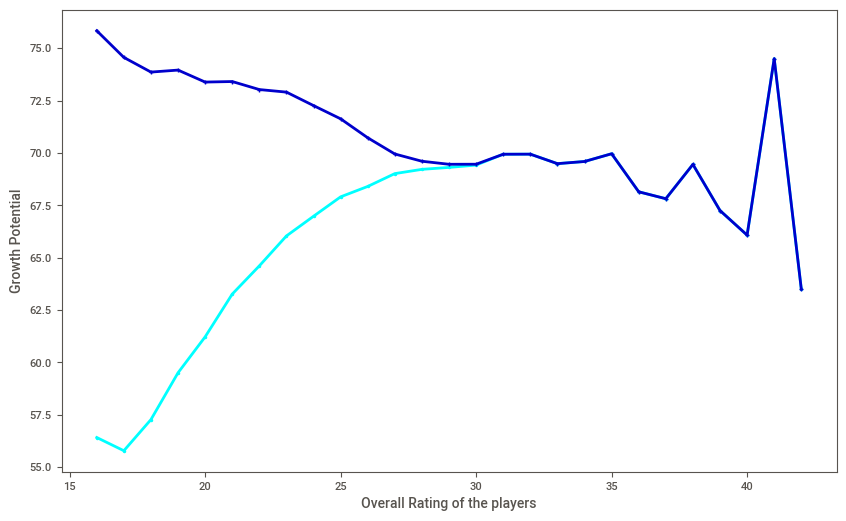

In [ ]:
overall = pd.DataFrame(df.groupby(['age'])['overall'].mean())
potential = pd.DataFrame(df.groupby(['age'])['potential'].mean())


merged_df = pd.merge(overall, potential, on= 'age', how ='inner')
merged_df['age'] = merged_df.index            # assigning the index values of merged_df to the column 'age'

fig, ax = plt.subplots(figsize = (10, 6))

merged_df.reset_index(drop = True, inplace = True)

plt.plot('age', 'overall', data = merged_df, color = '#00ffff', marker= '.', lw= 2, label ='Overall')
plt.plot('age', 'potential', data = merged_df, color= '#0000cc', marker= '+', lw=2, label = 'Potential')
plt.xlabel('Overall Rating of the players')
plt.ylabel('Growth Potential')
plt.show()

* From the above graph, we can clearly say till the age of 35, player's overall rating increases almost exponentially, while potential decreases. During 30 to 35 years, the line is pretty much horizontal indicating stagnant ratings. After the age of 35 years, the player's potential as well as rating decreases.

### AGE VS POTENTIAL OF THE PLAYERS WITH RESPECT TO THEIR VALUE

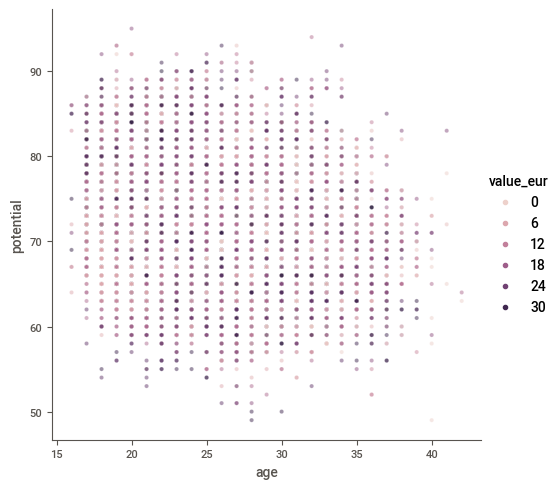

In [ ]:
value = abs(df.value_eur)

cmap = sns.cubehelix_palette(rot = -2, as_cmap = True)

sns.relplot(x= 'age', y= 'potential', hue= value/1000, alpha= 0.5, sizes = (40, 400), data = df)



1.   Younger players have higher potential rating.
2.   There is some kind of correlation between player's age and their value.



### HOW POTENTIAL AFFECTS THEIR WAGE?

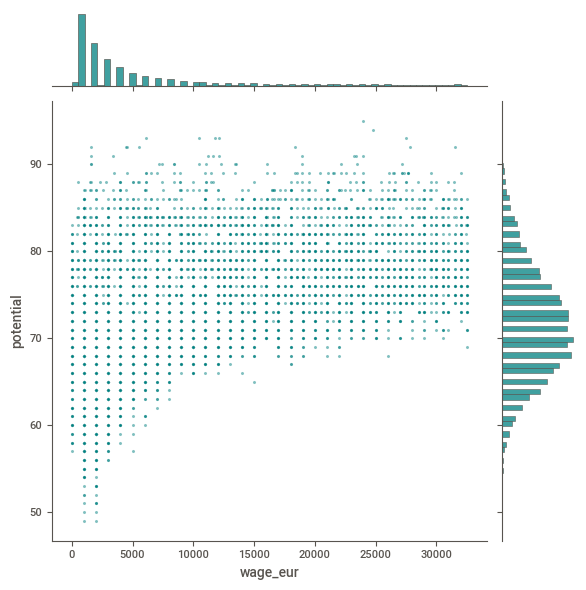

In [ ]:
sns.jointplot(x = abs(df['wage_eur']), y= df['potential'], joint_kws= {'alpha': 0.5, 's': 5, 'color': 'teal'},
              marginal_kws = {'color' : 'teal'})

* The wage(euros) tend to increase as your potential increases. When the potential starts decreasing, the wage drops.

### IMPACT OF AGE TO MOVEMENT REACTION

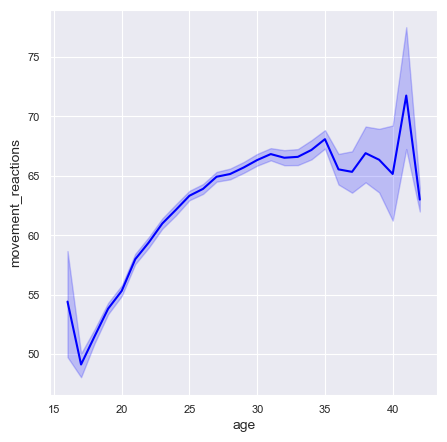

In [ ]:
plt.figure(figsize = (5,5))
sns.set_style('darkgrid')
sns.lineplot(x= 'age', y = 'movement_reactions', data = df, color = 'blue')
plt.show()



*   As the age of the player increases, the movement reaction also increases.




### IMPACT OF DRIBBLING AND DEFENDING

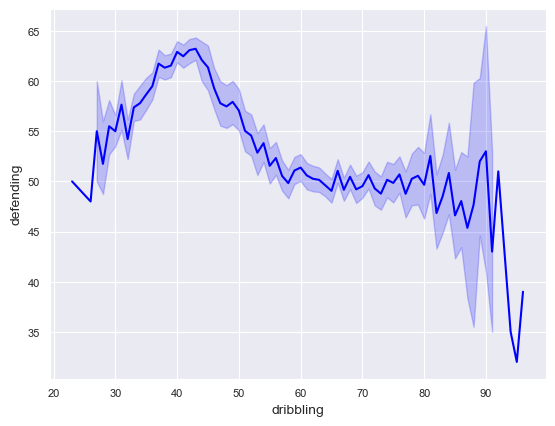

In [ ]:
sns.lineplot(x = 'dribbling', y = 'defending', data= df, color = 'blue')
plt.show()



*   When the dribbling score is between 30 to 50, the defending score is high.
*   As the dribbling score increases, the defending score decreases.



### IMPACT OF PHYSIC TO STAMINA

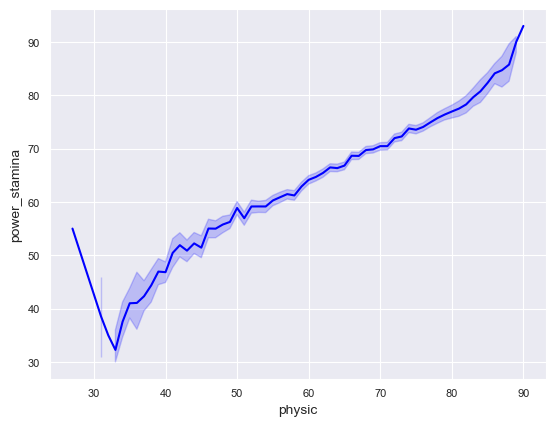

In [ ]:
sns.lineplot(x= 'physic', y= 'power_stamina', data = df, color= 'blue')
plt.show()



*   Around 30 to 35 physic score, the stamina stoops low. However, after that both increases at an exponential pace.




### RELATION BETWEEN LONG PASSING AND BALL CONTROL SKILLS WITH RESPECT TO FOOT

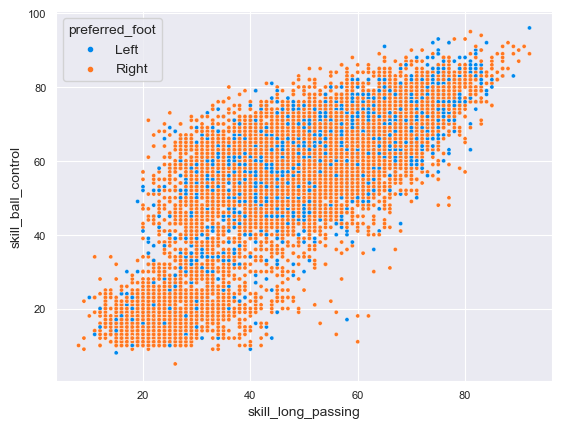

In [ ]:
sns.scatterplot(x= 'skill_long_passing', y= 'skill_ball_control', data = df, hue= 'preferred_foot')
plt.show()



*   Both left and right footed player possess good long passing and ball control skills.
*   Both of the attributes display linear relationship.



### RELATION OF TEAM POSITION TO SHOOTING

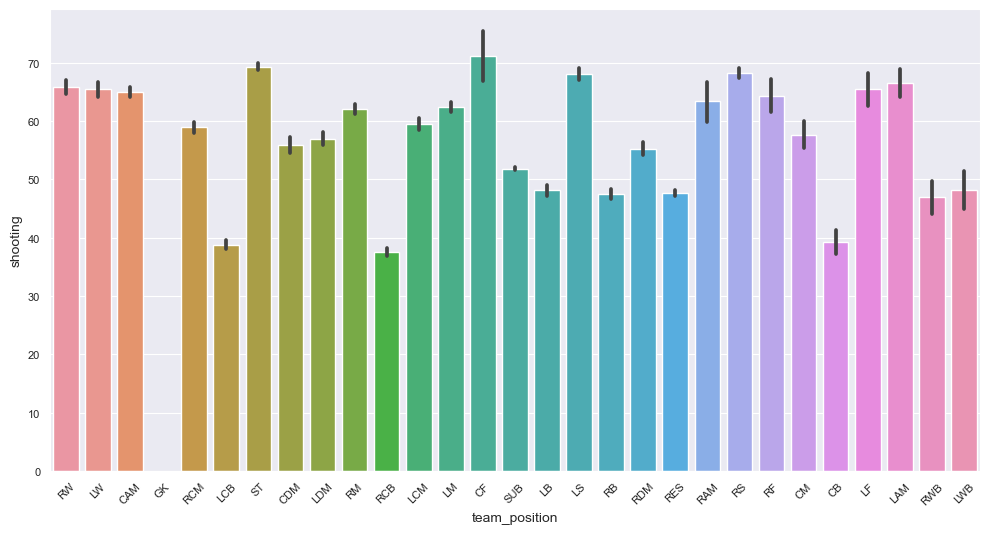

In [ ]:
plt.figure(figsize = (12, 6))
sns.barplot(x= 'team_position', y= 'shooting', data = df)
plt.xticks(rotation= 45)
plt.show()



*   Team CF has highest shooting score, whereas team GK has none.




### TOP 10 TEAMS WITH HIGHEST OVERALL RATING

In [ ]:
df.groupby('club')['overall'].mean().reset_index().sort_values(by= 'overall', ascending = False)[0:10]

,club,overall
226,FC Bayern München,81.304348
505,Real Madrid,80.121212
350,Juventus,80.060606
650,Uruguay,78.608696
224,FC Barcelona,78.363636
407,Mexico,78.000000
426,Netherlands,78.000000
166,Colombia,78.000000
77,Bayer 04 Leverkusen,77.280000
141,Chelsea,77.060606


In [ ]:
club = df.groupby('club')['overall'].mean().reset_index().sort_values('overall', ascending=True).tail(10)
fig = px.bar(club, x="overall", y="club", orientation='h')
fig.show()


*   FC Bayern Munchen, Real Madrid and Juventus are top clubs with players who have highest overall rating.




## TOP 10 PLAYERS

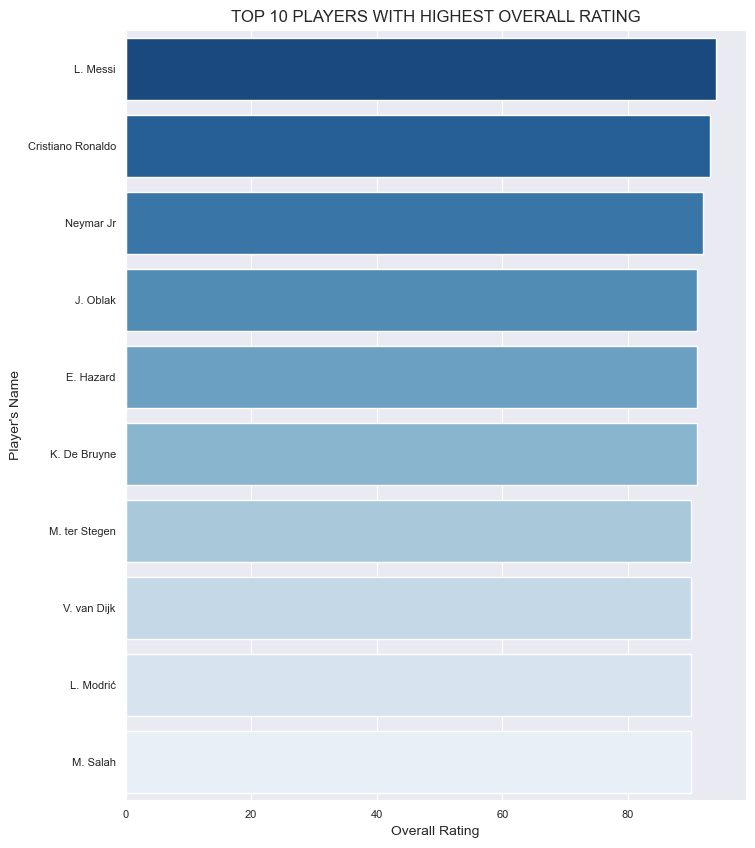

In [ ]:
rating = df['overall']
name = df['short_name']

top10_players = pd.DataFrame({'short_name' : name, 'overall': rating })

x = df['overall'].head(10)
y = df['short_name'].head(10)

plt.figure(figsize = (8,10))
plot_fig = sns.barplot(x = x, y = y, palette = 'Blues_r', orient= 'h')
plt.xticks()
plt.xlabel('Overall Rating', size = 10)
plt.ylabel("Player's Name", size = 10)
plt.title("TOP 10 PLAYERS WITH HIGHEST OVERALL RATING")
plt.show()



*   Messi is the best player with highest overall rating among others, followed by C Ronaldo and Neymar Jr.




### CORRELATION BETWEEN NUMERICAL ATTRIBUTES

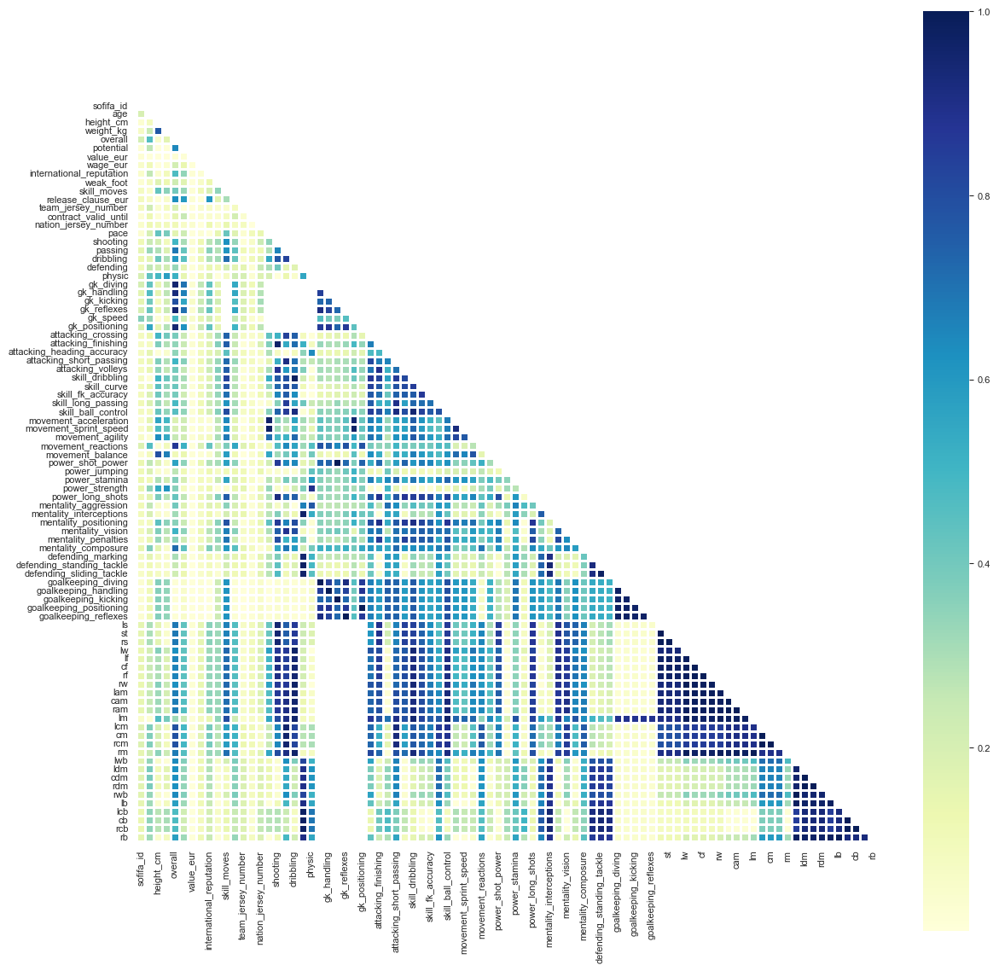

In [ ]:
corr = df.corr().abs()

# creating a mask of zeros to hide the upper portion as they include duplicate information and self-correlation
mask = np.zeros_like(corr)
mask[np.triu_indices_from(mask)] = True

with sns.axes_style('white'):
  f, ax = plt.subplots(figsize = (14,14))
  ax= sns.heatmap(corr, mask = mask, square = True, lw= 0.8, cmap= 'YlGnBu')

* There are missing values in gk diving, handling, reflexes,etc.

* There is high correlation in dribbling, skill_curve, attacking crossing , attacking finishing, etc.

## NUMBER OF PLAYERS BY CATEGORICAL VARIABLES

In [ ]:
def pie_count(data, field="Nationality", percent_limit=0.5, title="Number of players by "):

    title += field
    #data[field] = data[field].fillna('NA')
    data = data[field].value_counts().to_frame()

    total = data[field].sum()
    data['percentage'] = 100 * data[field]/total

    percent_limit = percent_limit
    otherdata = data[data['percentage'] < percent_limit]
    others = otherdata['percentage'].sum()
    maindata = data[data['percentage'] >= percent_limit]

    data = maindata
    other_label = "Others(<" + str(percent_limit) + "% each)"
    data.loc[other_label] = pd.Series({field:otherdata[field].sum()})

    labels = data.index.tolist()
    datavals = data[field].tolist()

    trace = go.Pie(labels = labels,
                values = datavals)

    layout = go.Layout(
        title = title,
        height=700
        )

    fig = go.Figure(data=[trace], layout=layout)
    fig.show()

pie_count(df, 'work_rate', 0.1)
pie_count(df, 'body_type', 0.1)
pie_count(df, 'preferred_foot', 0.1)
pie_count(df, 'team_position', 0.1)

## PAIRPLOT OF SOME ATTRIBUTES OF A PLAYER

In [ ]:
df_1 = df[['age', 'overall', 'potential', 'movement_acceleration', 'movement_sprint_speed', 'movement_agility', 'power_stamina', 'power_strength', 'preferred_foot']]
df_1.head(10)

,age,overall,potential,movement_acceleration,movement_sprint_speed,movement_agility,power_stamina,power_strength,preferred_foot
0,32,94,94,91,84,93,75,68,Left
1,34,93,93,89,91,87,85,78,Right
2,27,92,92,94,89,96,81,49,Right
3,26,91,93,43,60,67,41,78,Right
4,28,91,91,94,88,95,84,63,Right
5,28,91,91,77,76,78,89,74,Right
6,27,90,93,38,50,37,35,78,Right
7,27,90,91,74,79,61,75,92,Right
8,33,90,90,77,71,92,85,58,Right
9,27,90,90,94,92,91,85,73,Left


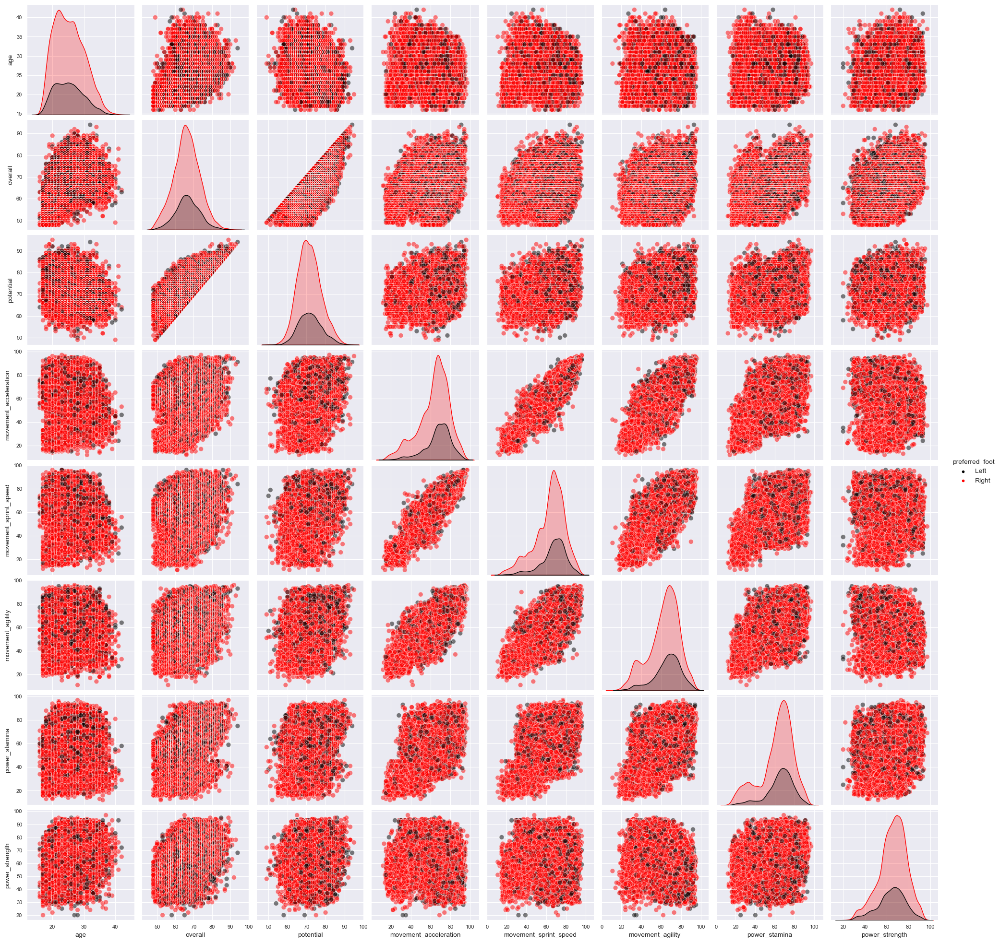

In [ ]:
sns.pairplot(df_1, hue = 'preferred_foot', palette =['black', 'red'], plot_kws =dict(s =50, alpha = 0.5))



*   Most of the players are right footed.
*   There is linear relation between 'movement_sprint_speed' and 'movement_acceleration'.


*   Some unusual relationship between 'overall' and 'potential'.






### A MAP WITH PLAYER'S OVERALL RATING

In [ ]:
overall_rating = pd.DataFrame(df.groupby(['nationality'])['overall'].sum().reset_index())
count_data = pd.DataFrame(overall_rating.groupby('nationality')['overall'].sum().reset_index())

count_data = [go.Choropleth(
      colorscale = 'plasma',
      locationmode = 'country names',
      locations = count_data['nationality'],
      text = count_data['nationality'],
      z = count_data['overall'])]

title = go.Layout(title = 'Distribution of players based on their overall rating and countries')

fig = go.Figure(data = count_data, layout = title)
py.iplot(fig)

**When you hover over the above map, the sum of overall ratings of all players of a particular country is displayed.**

## TASK 3



*   Prepare a rank ordered list of top 10 countries with most players. Which
countries are producing the most footballers that play at this level?




In [ ]:
df['nationality'].value_counts()[0:10]

England        1667
Germany        1216
Spain          1035
France          984
Argentina       886
Brazil          824
Italy           732
Colombia        591
Japan           453
Netherlands     416
Name: nationality, dtype: int64

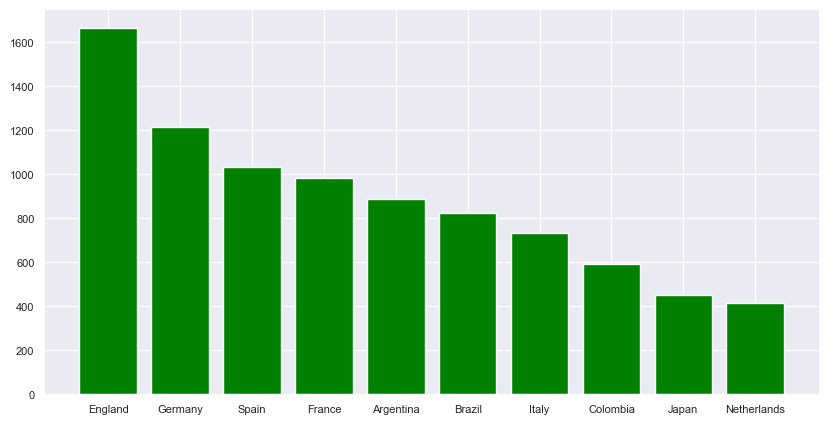

In [ ]:
x = list(df['nationality'].value_counts()[0:10].keys())
y = list(df['nationality'].value_counts()[0:10])

plt.figure(figsize = (10,5))
plt.bar(x, y, color = 'g')
plt.show()

**From the above data, we can see England , Germanyand Spain are the top 3 countries producing most number of football players, among France, Argentina, Brazil, Italy, Colombia, Japan and Netherlands.**



*  Plot the distribution of overall rating vs. age of players. Interpret what is the age after which a player stops improving?




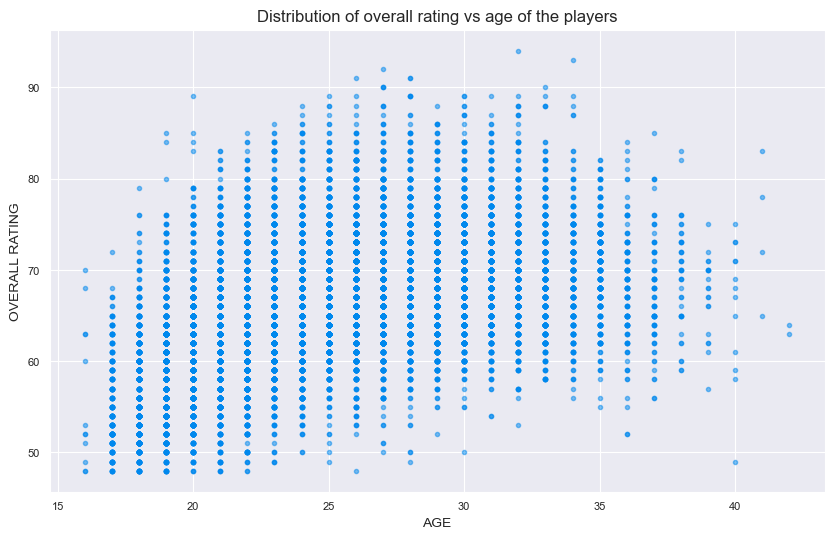

In [ ]:
plt.figure(figsize = (10,6))
plt.scatter(df['age'], df['overall'], alpha = 0.5)
plt.title("Distribution of overall rating vs age of the players")
plt.xlabel("AGE")
plt.ylabel("OVERALL RATING")
plt.grid(True)
plt.show()

**The scatter plots show that at young age the overall rating of the players are low. Steadily the overall rating increases till the age of 35. After 35 years, their improvement starts to slow down resulting in drop of overall rating.**



*  Which type of offensive players tends to get paid the most: the striker, the
right-winger, or the left-winger?




In [ ]:
positions = ['ST', 'RW', 'LW']
players = df[df['player_positions'].str.upper().isin(positions)]
players.head(5)

,sofifa_id,player_url,short_name,long_name,age,dob,height_cm,weight_kg,nationality,club,overall,potential,value_eur,wage_eur,player_positions,preferred_foot,international_reputation,weak_foot,skill_moves,work_rate,body_type,real_face,release_clause_eur,player_tags,team_position,team_jersey_number,loaned_from,joined,contract_valid_until,nation_position,nation_jersey_number,pace,shooting,passing,dribbling,defending,physic,gk_diving,gk_handling,gk_kicking,gk_reflexes,gk_speed,gk_positioning,player_traits,attacking_crossing,attacking_finishing,attacking_heading_accuracy,attacking_short_passing,attacking_volleys,skill_dribbling,skill_curve,skill_fk_accuracy,skill_long_passing,skill_ball_control,movement_acceleration,movement_sprint_speed,movement_agility,movement_reactions,movement_balance,power_shot_power,power_jumping,power_stamina,power_strength,power_long_shots,mentality_aggression,mentality_interceptions,mentality_positioning,mentality_vision,mentality_penalties,mentality_composure,defending_marking,defending_standing_tackle,defending_sliding_tackle,goalkeeping_diving,goalkeeping_handling,goalkeeping_kicking,goalkeeping_positioning,goalkeeping_reflexes,ls,st,rs,lw,lf,cf,rf,rw,lam,cam,ram,lm,lcm,cm,rcm,rm,lwb,ldm,cdm,rdm,rwb,lb,lcb,cb,rcb,rb
12,5518,https://sofifa.com/player/202126/harry-kane/20...,H. Kane,Harry Kane,25,1993-07-28,188,89,England,Tottenham Hotspur,89,91,31424,23392,ST,Right,3,4,3,High/High,Normal,Yes,159800000.0,"#Engine, #Distance Shooter, #Clinical Finisher",ST,10.0,NaN,2010-07-01,2024.0,ST,9.0,70.0,91.0,79.0,81.0,47.0,83.0,NaN,NaN,NaN,NaN,NaN,NaN,"Injury Free, Avoids Using Weaker Foot, Argues ...",75,94,86,81,85,80,78,68,83,84,68,72,71,91,73,90,79,87,84,86,78,35,93,81,90,91,56,36,38,8,10,11,14,11,89.0,89.0,89.0,85.0,87.0,87.0,87.0,85.0,86.0,86.0,86.0,85.0,82.0,82.0,82.0,85.0,68.0,69.0,69.0,69.0,68.0,65.0,63.0,63.0,63.0,65.0
17,22007,https://sofifa.com/player/153079/sergio-aguero...,S. Agüero,Sergio Leonel Agüero del Castillo,31,1988-06-02,173,70,Argentina,Manchester City,89,89,-30976,-27680,ST,Right,4,4,4,High/Medium,Stocky,Yes,111000000.0,"#Dribbler, #Clinical Finisher, #Complete Forward",ST,10.0,NaN,2011-07-28,2021.0,ST,9.0,80.0,90.0,77.0,88.0,33.0,74.0,NaN,NaN,NaN,NaN,NaN,NaN,"Avoids Using Weaker Foot, Outside Foot Shot",70,93,78,83,85,88,83,73,64,89,82,78,84,92,91,89,81,79,74,84,65,24,93,83,83,90,30,29,24,13,15,6,11,14,90.0,90.0,90.0,88.0,90.0,90.0,90.0,88.0,88.0,88.0,88.0,86.0,80.0,80.0,80.0,86.0,63.0,61.0,61.0,61.0,63.0,59.0,53.0,53.0,53.0,59.0
19,-20028,https://sofifa.com/player/176580/luis-suarez/2...,L. Suárez,Luis Alberto Suárez Díaz,32,1987-01-24,182,86,Uruguay,FC Barcelona,89,89,-18624,27320,ST,Right,5,4,3,High/Medium,Normal,Yes,108700000.0,"#Distance Shooter, #Strength, #Clinical Finish...",ST,9.0,NaN,2014-07-11,2021.0,NaN,NaN,73.0,89.0,80.0,84.0,51.0,84.0,NaN,NaN,NaN,NaN,NaN,NaN,"Diver, Speed Dribbler (CPU AI Only)",78,91,83,82,90,85,86,82,72,84,76,70,79,92,79,88,69,82,86,86,87,41,92,82,83,85,57,45,38,27,25,31,33,37,91.0,91.0,91.0,88.0,90.0,90.0,90.0,88.0,89.0,89.0,89.0,87.0,84.0,84.0,84.0,87.0,72.0,72.0,72.0,72.0,72.0,69.0,68.0,68.0,68.0,69.0
20,-8063,https://sofifa.com/player/188545/robert-lewand...,R. Lewandowski,Robert Lewandowski,30,1988-08-21,184,80,Poland,FC Bayern München,89,89,12576,-27144,ST,Right,4,4,4,High/Medium,Normal,Yes,106400000.0,#Clinical Finisher,ST,9.0,NaN,2014-07-01,2021.0,LS,9.0,77.0,87.0,74.0,85.0,41.0,82.0,NaN,NaN,NaN,NaN,NaN,NaN,"Diver, Beat Offside Trap, Speed Dribbler (CPU ...",62,88,85,82,88,85,77,85,65,88,77,77,78,90,82,87,84,78,84,84,81,39,91,77,86,86,34,42,19,15,6,12,8,10,89.0,89.0,89.0,85.0,88.0,88.0,88.0,85.0,86.0,86.0,86.0,83.0,80.0,80.0,80.0,83.0,64.0,65.0,65.0,65.0,64.0,61.0,60.0,60.0,60.0,61.0
34,-16795,https://sofifa.com/player/179813/edinson-cavan...,E. Cavani,Edinson Roberto Cavani Gómez,32,1987-02-14,185,77,Uruguay,Paris Saint-Germain,88,88,10688,-1608,ST,Right,4,4,3,High/High,Lean,Yes,87000000.0,#Engine,ST,9.0,NaN,2013-07-16,2020.0,NaN,NaN,75.0,86.0,72.

In [ ]:
players.sort_values(by= ["wage_eur"], ascending = False)

,sofifa_id,player_url,short_name,long_name,age,dob,height_cm,weight_kg,nationality,club,overall,potential,value_eur,wage_eur,player_positions,preferred_foot,international_reputation,weak_foot,skill_moves,work_rate,body_type,real_face,release_clause_eur,player_tags,team_position,team_jersey_number,loaned_from,joined,contract_valid_until,nation_position,nation_jersey_number,pace,shooting,passing,dribbling,defending,physic,gk_diving,gk_handling,gk_kicking,gk_reflexes,gk_speed,gk_positioning,player_traits,attacking_crossing,attacking_finishing,attacking_heading_accuracy,attacking_short_passing,attacking_volleys,skill_dribbling,skill_curve,skill_fk_accuracy,skill_long_passing,skill_ball_control,movement_acceleration,movement_sprint_speed,movement_agility,movement_reactions,movement_balance,power_shot_power,power_jumping,power_stamina,power_strength,power_long_shots,mentality_aggression,mentality_interceptions,mentality_positioning,mentality_vision,mentality_penalties,mentality_composure,defending_marking,defending_standing_tackle,defending_sliding_tackle,goalkeeping_diving,goalkeeping_handling,goalkeeping_kicking,goalkeeping_positioning,goalkeeping_reflexes,ls,st,rs,lw,lf,cf,rf,rw,lam,cam,ram,lm,lcm,cm,rcm,rm,lwb,ldm,cdm,rdm,rwb,lb,lcb,cb,rcb,rb
2403,31978,https://sofifa.com/player/163050/billy-sharp/2...,B. Sharp,Billy Sharp,33,1986-02-05,175,70,England,Sheffield United,74,74,26592,32000,ST,Right,1,3,2,Medium/High,Stocky,No,7100000.0,NaN,SUB,10.0,NaN,2015-07-25,2021.0,NaN,NaN,58.0,74.0,62.0,64.0,42.0,68.0,NaN,NaN,NaN,NaN,NaN,NaN,"Diver, Avoids Using Weaker Foot, Beat Offside ...",61,79,78,66,74,58,65,55,53,69,62,55,67,79,72,72,55,66,67,64,75,33,83,65,75,76,49,34,28,7,8,11,11,8,74.0,74.0,74.0,69.0,71.0,71.0,71.0,69.0,69.0,69.0,69.0,68.0,65.0,65.0,65.0,68.0,55.0,56.0,56.0,56.0,55.0,54.0,54.0,54.0,54.0,54.0
3196,10954,https://sofifa.com/player/207562/sebastian-and...,S. Andersson,Sebastian Andersson,27,1991-07-15,190,86,Sweden,1. FC Union Berlin,73,73,-25376,32000,ST,Right,1,2,2,High/Medium,Normal,No,7700000.0,NaN,SUB,10.0,NaN,2018-07-01,2020.0,SUB,19.0,65.0,69.0,49.0,65.0,25.0,75.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,28,76,79,65,68,64,38,42,31,69,63,67,57,72,55,70,64,76,78,55,71,22,77,60,60,61,19,17,20,10,9,14,15,6,73.0,73.0,73.0,65.0,70.0,70.0,70.0,65.0,66.0,66.0,66.0,64.0,59.0,59.0,59.0,64.0,47.0,47.0,47.0,47.0,47.0,45.0,45.0,45.0,45.0,45.0
2078,15415,https://sofifa.com/player/212023/robert-beric/...,R. Berić,Robert Berić,28,1991-06-17,188,83,Slovenia,AS Saint-Étienne,75,75,-12352,32000,ST,Right,2,3,3,Medium/Medium,Normal,No,13300000.0,NaN,SUB,27.0,NaN,2015-08-31,2022.0,SUB,19.0,57.0,76.0,65.0,67.0,38.0,72.0,NaN,NaN,NaN,NaN,NaN,NaN,Power Free-Kick,52,81,74,72,69,67,65,56,65,72,60,55,58,73,53,73,71,69,77,67,65,38,82,70,71,73,38,30,23,16,11,15,12,16,75.0,75.0,75.0,70.0,73.0,73.0,73.0,70.0,72.0,72.0,72.0,70.0,69.0,69.0,69.0,70.0,54.0,57.0,57.0,57.0,54.0,52.0,52.0,52.0,52.0,52.0
1236,16824,https://sofifa.com/player/213432/facundo-ferre...,F. Ferreyra,Facundo Ferreyra,28,1991-03-14,186,76,Argentina,RCD Espanyol,77,77,21568,32000,ST,Right,1,3,3,Medium/Low,Normal,No,NaN,NaN,RS,9.0,SL Benfica,NaN,2020.0,NaN,NaN,65.0,76.0,59.0,74.0,31.0,68.0,NaN,NaN,NaN,NaN,NaN,NaN,"Beat Offside Trap, Long Passer (CPU AI Only)",49,80,82,67,70,74,48,42,53,76,64,66,75,75,67,75,65,69,72,68,58,23,80,66,70,79,22,29,26,11,11,8,14,15,77.0,77.0,77.0,72.0,75.0,75.0,75.0,72.0,73.0,73.0,73.0,70.0,66.0,66.0,66.0,70.0,52.0,52.0,52.0,52.0,52.0,50.0,48.0,48.0,48.0,50.0
3557,26675,https://sofifa.com/player/223283/famara-diedhi...,F. Diedhiou,Famara Diedhiou,26,1992-12-15,189,80,Senegal,Bristol City,72,75,-32160,32000,ST,Right,1,2,3,Medium/Medium,Normal,No,7800000.0,NaN,ST,9.0,NaN,2017-06-28,2021.0,NaN,NaN,60.0,70.0,46.0,66.0,31.0,73.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,33,73,79,57,63,66,53,33,35,68,53,65,60,64,58,76,60,56,87,58,63,22,78,50,75,61,35,22,16,7,10,15,11,12,72.0,72.0,72.0,63.0,68.0,68.0,68.0,63.0,63.0,63.0,63.0,61.0,56.0,56.0,56.0,61.0,45.0,46.0,46.0,46.0,45.0,43.0,47.0,47.0,

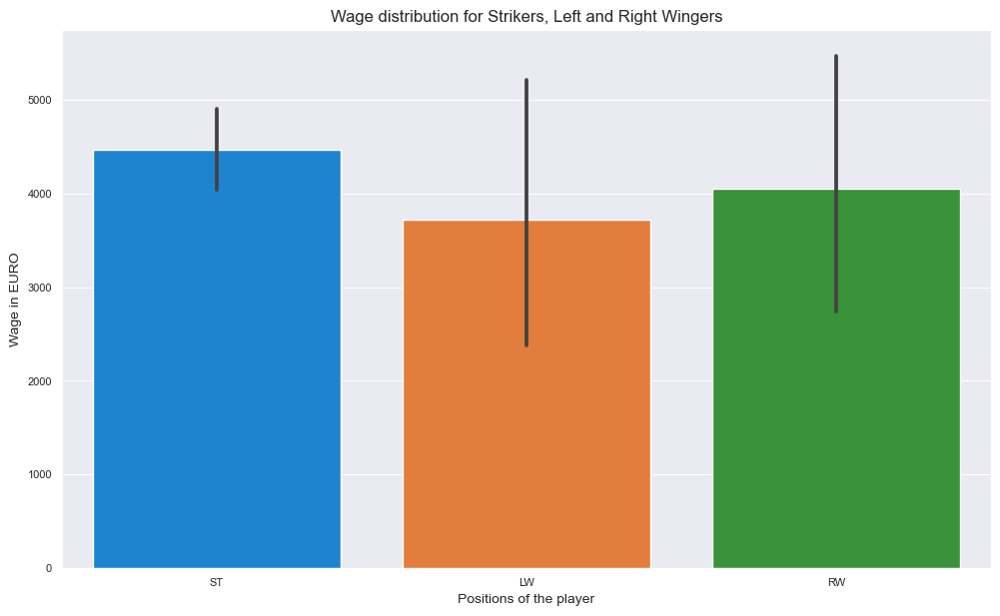

In [ ]:
plt.figure(figsize = (12,7))
sns.barplot(data = players, x= 'player_positions', y= 'wage_eur')
plt.title("Wage distribution for Strikers, Left and Right Wingers")
plt.xlabel("Positions of the player")
plt.ylabel("Wage in EURO")
plt.show()

**From the above plot, we can observe that Strikers get paid the most as compared to Left and Right Wingers.**

## TASK 2

* **Explore football skills and cluster football players based on their attributes.**

In [ ]:
to_drop = ['sofifa_id','player_url','long_name','potential','dob',\
           'work_rate','body_type','real_face','release_clause_eur','player_tags',\
           'team_position','team_jersey_number','loaned_from','joined','contract_valid_until',\
           'nation_position','nation_jersey_number','player_traits',\
           'value_eur','wage_eur']
data = df.drop(to_drop, axis=1)

In [ ]:
pd.DataFrame(data.dtypes).T

,short_name,age,height_cm,weight_kg,nationality,club,overall,player_positions,preferred_foot,international_reputation,weak_foot,skill_moves,pace,shooting,passing,dribbling,defending,physic,gk_diving,gk_handling,gk_kicking,gk_reflexes,gk_speed,gk_positioning,attacking_crossing,attacking_finishing,attacking_heading_accuracy,attacking_short_passing,attacking_volleys,skill_dribbling,skill_curve,skill_fk_accuracy,skill_long_passing,skill_ball_control,movement_acceleration,movement_sprint_speed,movement_agility,movement_reactions,movement_balance,power_shot_power,power_jumping,power_stamina,power_strength,power_long_shots,mentality_aggression,mentality_interceptions,mentality_positioning,mentality_vision,mentality_penalties,mentality_composure,defending_marking,defending_standing_tackle,defending_sliding_tackle,goalkeeping_diving,goalkeeping_handling,goalkeeping_kicking,goalkeeping_positioning,goalkeeping_reflexes,ls,st,rs,lw,lf,cf,rf,rw,lam,cam,ram,lm,lcm,cm,rcm,rm,lwb,ldm,cdm,rdm,rwb,lb,lcb,cb,rcb,rb
0,object,int64,int64,int64,object,object,int64,object,object,int64,int64,int64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,int64,int64,int64,int64,int64,int64,int64,int64,int64,int64,int64,int64,int64,int64,int64,int64,int64,int64,int64,int64,int64,int64,int64,int64,int64,int64,int64,int64,int64,int64,int64,int64,int64,int64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64


In [ ]:
corr_matrix = data.corr().abs()

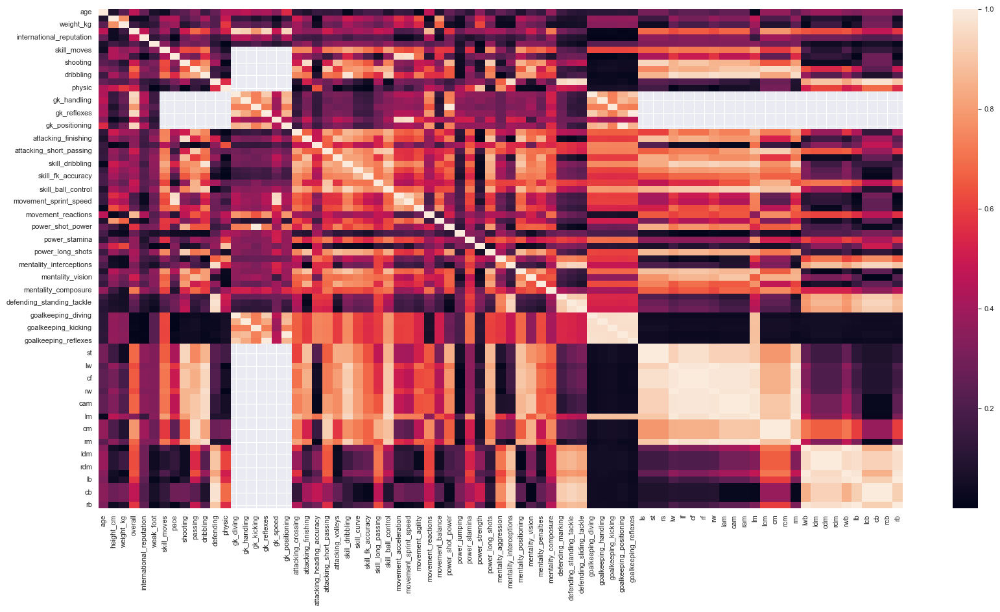

In [ ]:
plt.figure(figsize=(20,10))
ax = sns.heatmap(corr_matrix)

- As we can see, goalkeeper related features are perfectly correlated as seen by the white squares in the data. Goalkeepers are a separate group and none of the main player skills apply to goalkeepers. We will assume this as a separate cluster and remove all goalkeepers from the dataset which implies that we will also have to drop the rows with player_position value GK and gk.  
- Principal Component Analysis (PCA) is a technique used for dimensionality reduction and data visualization. It works with continuous numerical features. Since categorical features are discrete in nature and have limited variance, they might not be suitable for PCA. Therefore, as part of preparing the data for PCA, the decision is made to drop all categorical features from the dataset.
- PCA looks to capture the maximum variance in the data in the principal components and categorical features are discrete in nature with zero variance.

In [ ]:
goalkeeper_features = ['gk_handling','gk_reflexes','gk_positioning','gk_diving','gk_kicking','gk_speed','goalkeeping_diving',
                       'goalkeeping_handling','goalkeeping_kicking','goalkeeping_positioning','goalkeeping_reflexes']
data = df.drop(goalkeeper_features, axis = 1)

Now we will have to also drop the rows with player_position with the value GK / gk. That is, we will drop all the goalkeepers from the dataset.

In [ ]:
values_to_drop = ["GK", "gk"]
data = data[~data.apply(lambda row: any(value in str(row) for value in values_to_drop), axis=1)]

Now let's drop all the categorical features

In [ ]:
categorical_features = ['short_name','nationality','club','preferred_foot','player_positions','international_reputation',
                        'weak_foot','skill_moves','sofifa_id','player_url','long_name','potential','dob','work_rate',
                        'body_type','real_face','release_clause_eur','player_tags','team_position','team_jersey_number',
                        'loaned_from','joined','contract_valid_until','nation_position','nation_jersey_number',
                        'player_traits','value_eur','wage_eur']
data = data.drop(categorical_features, axis =1)

In [ ]:
data = data.fillna(0)
data.shape

(16237, 65)

In [ ]:
data

,age,height_cm,weight_kg,overall,pace,shooting,passing,dribbling,defending,physic,attacking_crossing,attacking_finishing,attacking_heading_accuracy,attacking_short_passing,attacking_volleys,skill_dribbling,skill_curve,skill_fk_accuracy,skill_long_passing,skill_ball_control,movement_acceleration,movement_sprint_speed,movement_agility,movement_reactions,movement_balance,power_shot_power,power_jumping,power_stamina,power_strength,power_long_shots,mentality_aggression,mentality_interceptions,mentality_positioning,mentality_vision,mentality_penalties,mentality_composure,defending_marking,defending_standing_tackle,defending_sliding_tackle,ls,st,rs,lw,lf,cf,rf,rw,lam,cam,ram,lm,lcm,cm,rcm,rm,lwb,ldm,cdm,rdm,rwb,lb,lcb,cb,rcb,rb
0,32,170,72,94,87.0,92.0,92.0,96.0,39.0,66.0,88,95,70,92,88,97,93,94,92,96,91,84,93,95,95,86,68,75,68,94,48,40,94,94,75,96,33,37,26,91.0,91.0,91.0,95.0,95.0,95.0,95.0,95.0,95.0,95.0,95.0,94.0,89.0,89.0,89.0,94.0,70.0,68.0,68.0,68.0,70.0,65.0,54.0,54.0,54.0,65.0
1,34,187,83,93,90.0,93.0,82.0,89.0,35.0,78.0,84,94,89,83,87,89,81,76,77,92,89,91,87,96,71,95,95,85,78,93,63,29,95,82,85,95,28,32,24,94.0,94.0,94.0,92.0,93.0,93.0,93.0,92.0,91.0,91.0,91.0,91.0,84.0,84.0,84.0,91.0,68.0,64.0,64.0,64.0,68.0,64.0,56.0,56.0,56.0,64.0
2,27,175,68,92,91.0,85.0,87.0,95.0,32.0,58.0,87,87,62,87,87,96,88,87,81,95,94,89,96,92,84,80,61,81,49,84,51,36,87,90,90,94,27,26,29,87.0,87.0,87.0,93.0,92.0,92.0,92.0,93.0,93.0,93.0,93.0,92.0,85.0,85.0,85.0,92.0,69.0,64.0,64.0,64.0,69.0,64.0,49.0,49.0,49.0,64.0
4,28,175,74,91,91.0,83.0,86.0,94.0,35.0,66.0,81,84,61,89,83,95,83,79,83,94,94,88,95,90,94,82,56,84,63,80,54,41,87,89,88,91,34,27,22,86.0,86.0,86.0,92.0,91.0,91.0,91.0,92.0,92.0,92.0,92.0,92.0,86.0,86.0,86.0,92.0,69.0,66.0,66.0,66.0,69.0,64.0,52.0,52.0,52.0,64.0
5,28,181,70,91,76.0,86.0,92.0,86.0,61.0,78.0,93,82,55,92,82,86,85,83,91,91,77,76,78,91,76,91,63,89,74,90,76,61,88,94,79,91,68,58,51,85.0,85.0,85.0,90.0,90.0,90.0,90.0,90.0,91.0,91.0,91.0,91.0,90.0,90.0,90.0,91.0,80.0,80.0,80.0,80.0,80.0,76.0,69.0,69.0,69.0,76.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
18273,22,186,79,48,57.0,23.0,28.0,33.0,47.0,51.0,21,17,40,35,27,24,23,21,28,35,56,58,45,40,73,36,70,60,47,16,46,48,28,25,39,41,45,50,52,34.0,34.0,34.0,33.0,33.0,33.0,33.0,33.0,33.0,33.0,33.0,35.0,35.0,35.0,35.0,35.0,45.0,44.0,44.0,44.0,45.0,47.0,48.0,48.0,48.0,47.0
18274,22,177,66,48,58.0,24.0,33.0,35.0,48.0,48.0,24,20,42,43,28,32,24,29,39,31,55,61,43,41,76,33,72,55,44,20,42,49,23,25,37,35,42,53,57,35.0,35.0,35.0,35.0,34.0,34.0,34.0,35.0,35.0,35.0,35.0,37.0,38.0,38.0,38.0,37.0,46.0,45.0,45.0,45.0,46.0,48.0,49.0,49.0,49.0,48.0
18275,19,186,75,48,54.0,35.0,44.0,45.0,48.0,51.0,32,33,49,53,32,40,32,32,55,49,55,54,52,52,57,48,60,50,51,26,50,45,38,38,36,39,46,52,46,45.0,45.0,45.0,45.0,45.0,45.0,45.0,45.0,46.0,46.0,46.0,47.0,48.0,48.0,48.0,47.0,49.0,51.0,51.0,51.0,49.0,49.0,51.0,51.0,51.0,49.0
18276,18,185,74,48,59.0,35.0,47.0,47.0,45.0,52.0,39,34,47,54,28,42,37,39,48,49,55,63,55,54,59,46,61,42,55,28,57,49,31,48,36,40,39,44,54,45.0,45.0,45.0,47.0,46.0,46.0,46.0,47.0,48.0,48.0,48.0,48.0,48.0,48.0,48.0,48.0,50.0,50.0,50.0,50.0,50.0,50.0,51.0,51.0,51.0,50.0


## **Feature Relevance**

1. **Current Situation:**
   - After certain preprocessing steps, we have a dataset with 65 variables (features).
   - The main focus is to investigate whether the variable "overall" and other summary skills (attributes) can be effectively predicted or explained by the remaining variables.

2. **Objective:**
   - To assess the explanatory power of the variables, a regression model will be constructed.
   - Specifically, a DecisionTree regression model will be used for this purpose.

3. **Building the Regression Model:**
   - The intention is to treat one of the features (variables) as the response variable, while all other features are used as predictors or independent variables.
   - The response variable will be subjected to regression analysis to understand how well it can be predicted based on the other features.

4. **Function for Regression Analysis:**
   - To streamline the process, a function will be created to perform the regression analysis.
   - This function will take a feature as the response variable and all the other features as predictors.
   - It will calculate the R-squared (R2) score, which measures how well the variation in the response variable is explained by the predictors.

5. **Selecting Features with High R2 Scores:**
   - The R2 score serves as an indicator of the proportion of variance in the response variable that is explained by the predictors.
   - Features with R2 scores greater than 0.95 are considered.
   - If a feature's R2 score is high, it suggests that a substantial portion of its variability can be accounted for by the other variables.
   - Since these features can be well explained by the remaining variables, they might not contribute much additional information to the analysis.

6. **Feature Removal:**
   - Features with R2 scores greater than 0.95 will be removed from the dataset.
   - This step is based on the rationale that their variance is already captured by other variables, and they might not significantly enhance the analysis.

In summary, this approach aims to assess whether key attributes like "overall" and summary skills are predictable based on the other variables in the dataset. A DecisionTree regression model is used to measure this predictability. Features with high R2 scores (greater than 0.95) are removed from the dataset because they are well explained by other features and likely do not provide substantial additional insights. This process helps in simplifying the dataset by retaining the most informative variables while removing those with redundant information.

**ls,
st,
rs,
lw,
lf,
cf,
rf,
rw,
lam,
cam,
ram,
lm,
lcm,
cm,
rcm,
rm,
lwb,
ldm,
cdm,
rdm,
rwb,
lb,
lcb,
cb,
rcb,
rb have high R2 score and do not provide much information and hence will be dropped.**

In [ ]:
columns_to_drop = ['ls', 'st', 'rs', 'lw', 'lf', 'cf', 'rf', 'rw', 'lam', 'cam',
                   'ram', 'lm', 'lcm', 'cm', 'rcm', 'rm', 'lwb', 'ldm', 'cdm',
                   'rdm', 'rwb', 'lb', 'lcb', 'cb', 'rcb', 'rb']

data = data.drop(columns=columns_to_drop)

In [ ]:
def model_features(data, feature, random_state, hc_feat):
    new_data = data.drop(feature, axis = 1)

    from sklearn.model_selection import train_test_split
    X_train, X_test, y_train, y_test = train_test_split(new_data, data[feature], test_size = 0.20, random_state = random_state)

    from sklearn.tree import DecisionTreeRegressor
    regressor = DecisionTreeRegressor(random_state=random_state)
    regressor.fit(X_train, y_train)
    y_pred = regressor.predict(X_test)

    score =  regressor.score(X_test, y_test)
    if score >= 0.95:
        hc_feat.append(feature)
        print("R2 Score for feature {} is {}".format(feature, round(score,3) ))
    else:
        pass
    return hc_feat

In [ ]:
hc_feat = []
for key in data:
    model_features(data, key, random_state=13263600,hc_feat=hc_feat)

R2 Score for feature pace is 0.999
R2 Score for feature shooting is 0.991
R2 Score for feature passing is 0.978
R2 Score for feature dribbling is 0.989
R2 Score for feature defending is 0.992
R2 Score for feature physic is 0.981
R2 Score for feature attacking_finishing is 0.973
R2 Score for feature skill_dribbling is 0.975
R2 Score for feature movement_acceleration is 0.992
R2 Score for feature movement_sprint_speed is 0.995
R2 Score for feature defending_standing_tackle is 0.965


* Features with R-squared scores close to 1.0 (or 100%) indicate that they can be accurately predicted by the other features in the dataset. These features are highly correlated with other features and don't add much unique information to the analysis.

* Features with R-squared scores significantly below 1.0 indicate that they are not as well predicted by the other features. These features might contain more unique information and could be more important for the analysis.

In [ ]:
data = data.drop(hc_feat, axis = 1)
print(data.shape)
data.head()

(16237, 28)


,age,height_cm,weight_kg,overall,attacking_crossing,attacking_heading_accuracy,attacking_short_passing,attacking_volleys,skill_curve,skill_fk_accuracy,skill_long_passing,skill_ball_control,movement_agility,movement_reactions,movement_balance,power_shot_power,power_jumping,power_stamina,power_strength,power_long_shots,mentality_aggression,mentality_interceptions,mentality_positioning,mentality_vision,mentality_penalties,mentality_composure,defending_marking,defending_sliding_tackle
0,32,170,72,94,88,70,92,88,93,94,92,96,93,95,95,86,68,75,68,94,48,40,94,94,75,96,33,26
1,34,187,83,93,84,89,83,87,81,76,77,92,87,96,71,95,95,85,78,93,63,29,95,82,85,95,28,24
2,27,175,68,92,87,62,87,87,88,87,81,95,96,92,84,80,61,81,49,84,51,36,87,90,90,94,27,29
4,28,175,74,91,81,61,89,83,83,79,83,94,95,90,94,82,56,84,63,80,54,41,87,89,88,91,34,22
5,28,181,70,91,93,55,92,82,85,83,91,91,78,91,76,91,63,89,74,90,76,61,88,94,79,91,68,51


After conducting further analysis, it has become evident that we can analyze the dataset using the remaining 28 features. These features are highly relevant and provide us with the necessary tools to create clusters and group players based on their attributes.

# Principal Component Analysis (PCA)

## Feature Scaling
Since, for PCA we need scaled data, we will transform the dataset by trying various scaling techniques.

* Scaling techniques involve transforming the data in a way that maintains the relative relationships between variables while putting them on a common scale. This is crucial because PCA is sensitive to the magnitudes of variables.

* Scaling ensures that variables with larger magnitudes do not dominate the results, and the principal components are accurately identified based on the patterns in the data.

* The original distribution of the dataset can be seen in the figure below that shows how the data is distributed before scaling. This visualization helps in understanding the data's characteristics and identifying any potential outliers or patterns.

In [ ]:
data.describe().T

,count,mean,std,min,25%,50%,75%,max
age,16237.0,25.160067,4.544563,16.0,21.0,25.0,28.0,42.0
height_cm,16237.0,180.474903,6.451732,156.0,176.0,180.0,185.0,203.0
weight_kg,16237.0,74.438135,6.690438,50.0,70.0,74.0,79.0,110.0
overall,16237.0,66.427173,6.841954,48.0,62.0,66.0,71.0,94.0
attacking_crossing,16237.0,54.183224,14.043732,11.0,44.0,56.0,65.0,93.0
attacking_heading_accuracy,16237.0,56.993472,11.637804,12.0,49.0,58.0,65.0,93.0
attacking_short_passing,16237.0,62.729999,9.618628,23.0,57.0,64.0,69.0,92.0
attacking_volleys,16237.0,46.674447,14.700507,10.0,35.0,46.0,58.0,90.0
skill_curve,16237.0,51.437642,15.093904,11.0,40.0,52.0,63.0,94.0
skill_fk_accuracy,16237.0,46.284104,14.994424,10.0,34.0,44.0,58.0,94.0


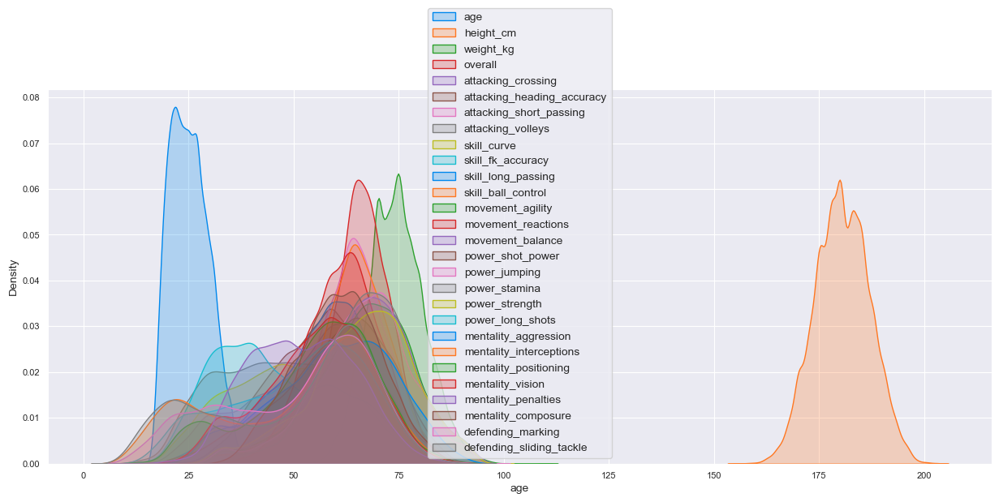

In [ ]:
plt.figure(figsize=(15,6))
for col in data.columns:
    sns.kdeplot(data[col], shade=True, label=col)
plt.legend(loc='lower center')
plt.show()

- The features (attributes) in the dataset are observed to have varying scales. This means that different features have values that span different ranges.
- Additionally, a majority of the features exhibit a slight left-skewed distribution. This suggests that the data tends to be more spread out towards the higher values, rather than symmetrically distributed.
- We try the following scaling techniques on the data and chose the one that results in the best explained variance by the first two principal components:    

| Scaling Technique |
|------|
|   Log Scaling	  |
|   Standard Scaling  |
|   Min Max Scaling  |
|   Log normal Scaling  |
- PCA selects the first two principal components by identifying the directions of maximum and next highest variance in the dataset. These components are chosen based on the "eigenvalues" associated with each "eigenvector". By projecting the data onto these components, PCA provides a reduced-dimensional representation of the data while preserving the most significant patterns and variability.
- Eigenvectors represent the directions (new dimensions) in the feature space along which the data varies the most. Eigenvalues indicate the amount of variance explained by each corresponding eigenvector. Higher eigenvalues indicate that the corresponding eigenvector explains more variance in the data.

# Transforming the data for PCA

In [ ]:
# This code helps to understand how much each original feature contributes to the new principal components created by PCA.
# It shows a bar plot with bars representing the weights of original features in the new components.
# The text on the plot tells how much of the total information is captured by each component.
# Overall, the code provides a visual way to comprehend the impact of features on the new dimensions generated by PCA.

from sklearn.decomposition import PCA
def pca_results(data, n_components=8):
    #PCA model
    pca = PCA(n_components=n_components, random_state=1).fit(data)

    #DataFrame creation
    dimensions = ['Dimension {}'.format(i) for i in range(1,len(pca.components_)+1)]
    components = pd.DataFrame(np.round(pca.components_, 4), columns = list(data.columns))
    components.index = dimensions

    # PCA explained variance
    ratios = pca.explained_variance_ratio_.reshape(len(pca.components_), 1)
    variance_ratios = pd.DataFrame(np.round(ratios, 4), columns = ['Explained Variance'])
    variance_ratios.index = dimensions

    # Create a bar plot visualization
    fig, ax = plt.subplots(figsize = (25,10))

    # Plot the feature weights as a function of the components
    components.plot(ax = ax, kind = 'bar');
    ax.set_ylabel("Feature Weights")
    ax.set_xticklabels(dimensions, rotation=0)
    plt.legend(loc='lower right')

    # Display the explained variance ratios
    for i, ev in enumerate(pca.explained_variance_ratio_):
        ax.text(i-0.40, ax.get_ylim()[1] + 0.05, "Explained Variance\n%.4f"%(ev))

    # Return a concatenated DataFrame
    df = pd.concat([variance_ratios, components], axis = 1)
    print(f'Total Variance Explained by the first 2 dimensions: {df.iloc[:2,0].sum()}')
    return df

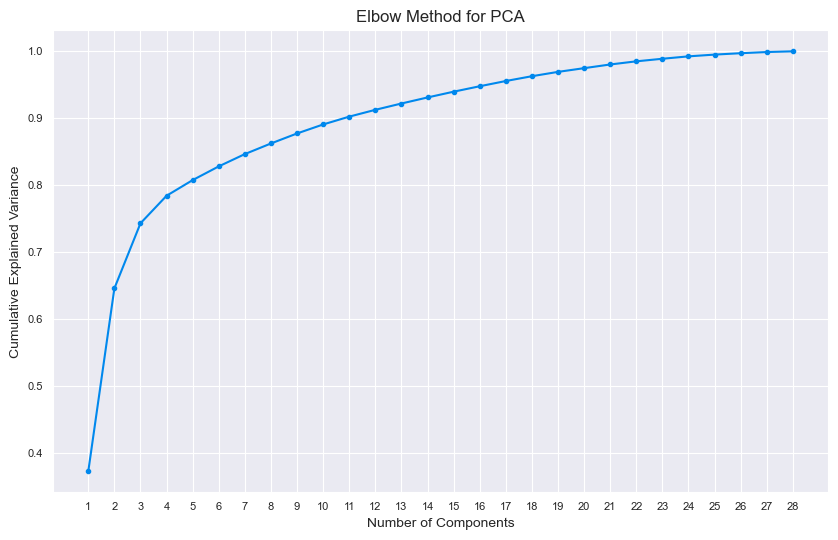

In [ ]:
explained_variance = []
for n in range(1, len(data.columns) + 1):
    pca = PCA(n_components=n, random_state=1).fit(data)
    explained_variance.append(sum(pca.explained_variance_ratio_))

# Plot the explained variance
plt.figure(figsize=(10, 6))
plt.plot(range(1, len(data.columns) + 1), explained_variance, marker='o')
plt.xlabel('Number of Components')
plt.ylabel('Cumulative Explained Variance')
plt.title('Elbow Method for PCA')
plt.xticks(range(1, len(data.columns) + 1))
plt.grid(True)
plt.show()


In [ ]:
# The cumsum() method  returns a dataframe with a cumulative sum for each row.
# It gives the variance ratio for each individual column in successive progression.
np.cumsum(pca.explained_variance_ratio_)

array([0.37287048, 0.6460587 , 0.74320539, 0.78432812, 0.80771567,
       0.82821432, 0.84654622, 0.86240847, 0.87733785, 0.89077587,
       0.90246552, 0.91265516, 0.9220652 , 0.93109235, 0.93971126,
       0.94783731, 0.95564474, 0.96282524, 0.9692868 , 0.97483646,
       0.98033745, 0.98503607, 0.98888131, 0.99246432, 0.99510009,
       0.99716666, 0.99890613, 1.        ])

Total Variance Explained by the first 2 dimensions: 0.6461


,Explained Variance,age,height_cm,weight_kg,overall,attacking_crossing,attacking_heading_accuracy,attacking_short_passing,attacking_volleys,skill_curve,skill_fk_accuracy,skill_long_passing,skill_ball_control,movement_agility,movement_reactions,movement_balance,power_shot_power,power_jumping,power_stamina,power_strength,power_long_shots,mentality_aggression,mentality_interceptions,mentality_positioning,mentality_vision,mentality_penalties,mentality_composure,defending_marking,defending_sliding_tackle
Dimension 1,0.3729,0.0269,-0.0570,-0.0394,0.0891,0.2372,-0.0185,0.1505,0.3074,0.3141,0.2837,0.1508,0.2000,0.1909,0.1099,0.1443,0.2564,-0.0206,0.0710,-0.0585,0.3422,-0.0246,-0.1357,0.3090,0.2637,0.2316,0.1470,-0.1321,-0.1818
Dimension 2,0.2732,0.0541,0.0325,0.0450,0.1187,0.1309,0.1415,0.1526,-0.0298,0.0783,0.0947,0.2209,0.0841,-0.0339,0.1473,-0.0430,0.0630,0.0952,0.1655,0.1584,0.0371,0.3140,0.4819,-0.0215,0.0799,-0.0350,0.1486,0.4304,0.4582
Dimension 3,0.0971,0.0592,0.2059,0.2199,0.0864,-0.2299,0.3984,-0.0296,0.1670,-0.0874,-0.0718,-0.1105,-0.0048,-0.2653,0.0924,-0.3710,0.1991,0.1367,-0.0009,0.4378,0.1164,0.1810,-0.1331,0.0516,-0.0561,0.1725,0.1100,-0.1189,-0.2014
Dimension 4,0.0411,-0.0023,0.1120,0.0794,-0.0630,0.0075,-0.1189,0.0561,0.0100,0.1343,0.2965,0.1762,-0.0314,-0.3703,-0.0876,-0.3286,0.0487,-0.5929,-0.3738,-0.0371,0.0528,-0.1659,0.0510,-0.1395,0.0784,0.0641,-0.0280,0.0520,0.0888
Dimension 5,0.0234,0.0419,-0.0773,-0.0504,-0.1048,-0.1702,0.0080,-0.2052,0.1110,0.2231,0.5132,-0.1702,-0.2157,-0.0497,-0.1238,0.1250,0.1008,0.4363,-0.2185,-0.1159,0.0937,0.1055,0.0672,-0.2759,-0.2092,0.2072,-0.1205,0.0305,0.0934
Dimension 6,0.0205,-0.0224,-0.0910,-0.1203,0.1086,-0.3085,0.2191,0.2283,0.0730,-0.2313,-0.2334,0.2645,0.1457,-0.0394,0.1476,0.1859,0.0650,0.1696,-0.5304,-0.2912,-0.0102,-0.1021,-0.0056,-0.1180,0.1190,0.1118,0.2302,0.0614,0.0173
Dimension 7,0.0183,-0.0453,-0.0812,-0.0701,-0.1145,-0.4521,-0.2668,-0.0287,0.0433,-0.2518,-0.0815,0.0553,-0.0896,0.0027,-0.1088,0.1511,0.3280,-0.2756,0.1834,-0.0759,0.3474,0.4531,0.0487,-0.0214,0.0931,-0.0672,-0.1114,-0.0433,0.0074
Dimension 8,0.0159,-0.0471,0.0702,0.0598,-0.0153,-0.2578,-0.1251,0.1271,-0.1728,-0.0922,0.1468,0.3108,-0.0002,0.0320,-0.0941,-0.0947,0.1186,0.2739,0.3399,0.1764,0.2083,-0.5856,-0.0083,-0.2333,0.1342,-0.0985,-0.0331,0.0833,-0.0563


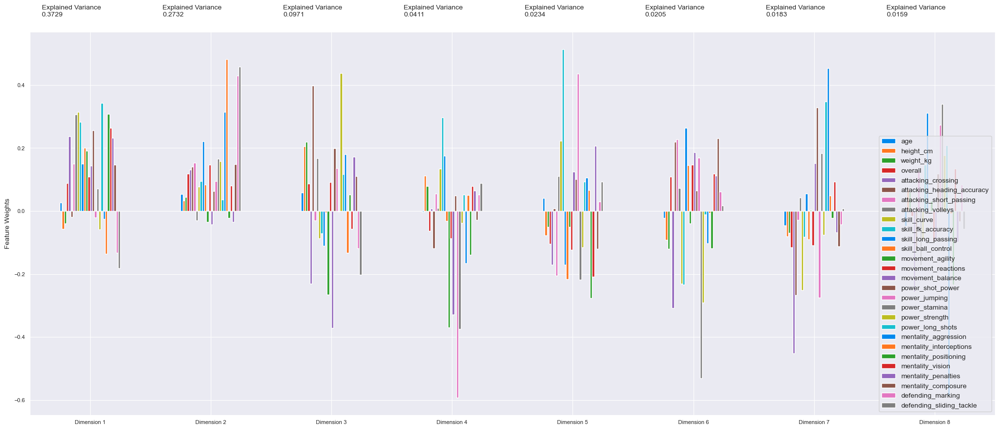

In [ ]:
pca_results(data)

In [ ]:
from sklearn.preprocessing import StandardScaler, MinMaxScaler

log_data = np.log(data)

scaler = StandardScaler()
minmax = MinMaxScaler()

minmax.fit(data)
scaler.fit(data)

scaled_data = scaler.transform(data)
scaled_data = pd.DataFrame(scaled_data, columns=data.columns)

minmax_data = minmax.transform(data)
minmax_data = pd.DataFrame(minmax_data, columns=data.columns)

scaler.fit(log_data)
log_normal_data = scaler.transform(log_data)
log_normal_data = pd.DataFrame(log_normal_data, columns=data.columns)

- **Log Transformation:**

log_data = np.log(data) computes the natural logarithm of each element in the original data dataset.
This transformation can help normalize the data, especially when the original distribution is skewed.

- **Standard Scaling:**

scaler = StandardScaler() initializes a StandardScaler object, which will be used to standardize the data.
scaler.fit(data) computes the mean and standard deviation of each feature in the original data.
scaled_data = scaler.transform(data) standardizes the data by subtracting the mean and dividing by the standard deviation.
The resulting scaled_data is a DataFrame with standardized values.

- **Min-Max Scaling:**

minmax = MinMaxScaler() initializes a MinMaxScaler object, which will be used to perform min-max scaling.
minmax.fit(data) computes the minimum and maximum values of each feature in the original data.
minmax_data = minmax.transform(data) scales the data to a specified range (usually [0, 1]) by mapping the minimum and maximum values accordingly.
The resulting minmax_data is a DataFrame with scaled values between 0 and 1.

- **Standard Scaling on Log-Transformed Data:**

scaler.fit(log_data) computes the mean and standard deviation of each feature in the log-transformed data.
log_normal_data = scaler.transform(log_data) standardizes the log-transformed data.
The resulting log_normal_data is a DataFrame with standardized values of the log-transformed data.

- **Insights:**

Standard Scaling (scaled_data) centers the data around mean zero and adjusts the scale by the standard deviation.
Min-Max Scaling (minmax_data) scales the data to the [0, 1] range, preserving the relative relationships between features.
Standard Scaling on Log-Transformed Data (log_normal_data) standardizes the log-transformed data.

In [ ]:
def plot_transformed_data(data):
    plt.figure(figsize=(20,6))
    for col in data.columns:
        sns.kdeplot(data[col], shade=True, label = col)
    plt.legend(loc='best');

**Plotting graphs to compare how the dataset looks before and after scaling.**

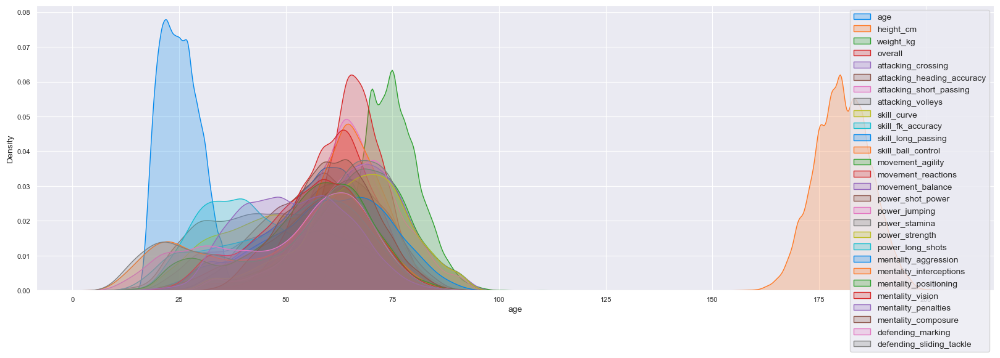

In [ ]:
plot_transformed_data(data)


The graph is a 2D representation of the clustering algorithm using PCA. The x-axis and y-axis represent the two principal components that were extracted from the data. The different colored lines represent the different clusters.

The insights that we can gain from this graph about FIFA20 players are:

* There are 5 clusters in total. The clusters are spread out across the graph, which suggests that there is a good amount of variation in the player attributes.
    - Cluster 1 is located in the upper-right corner of the graph, which suggests that these players have high values for both principal components. These players are likely to be well-rounded and have good stats in all areas.
    - Cluster 2 is located in the upper-left corner of the graph, which suggests that these players have high values for the first principal component but low values for the second principal component. These players are likely to be offensive-minded and have good stats for shooting, passing, and dribbling.
    - Cluster 3 is located in the lower-left corner of the graph, which suggests that these players have high values for the second principal component but low values for the first principal component. These players are likely to be defensive-minded and have good stats for tackling, heading, and interceptions.
    - Cluster 4 is located in the center of the graph, which suggests that these players have average values for both principal components. These players are likely to be physical and have good stats for strength, jumping, and stamina.
    - Cluster 5 is located in the lower-right corner of the graph, which suggests that these players have low values for both principal components. These players are likely to be technical and have good stats for ball control, vision, and free-kick accuracy.

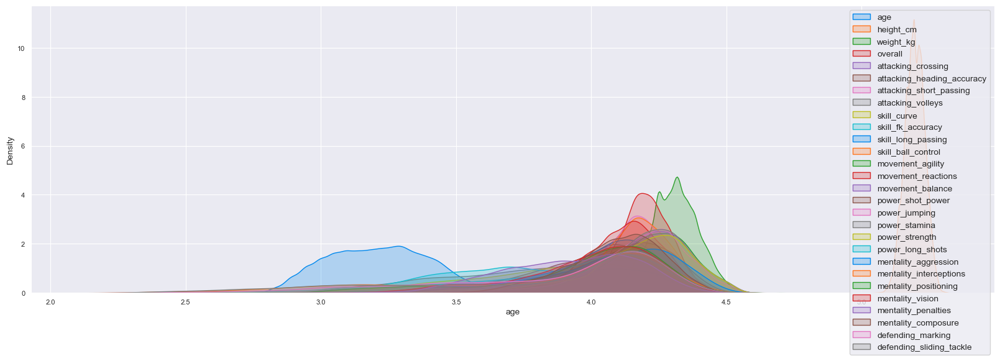

In [ ]:
plot_transformed_data(log_data)

In the above graph, the data points are more evenly distributed across the graph than they were in the original data. This suggests that the logarithmic transformation has helped to reveal the underlying relationships between the variables.

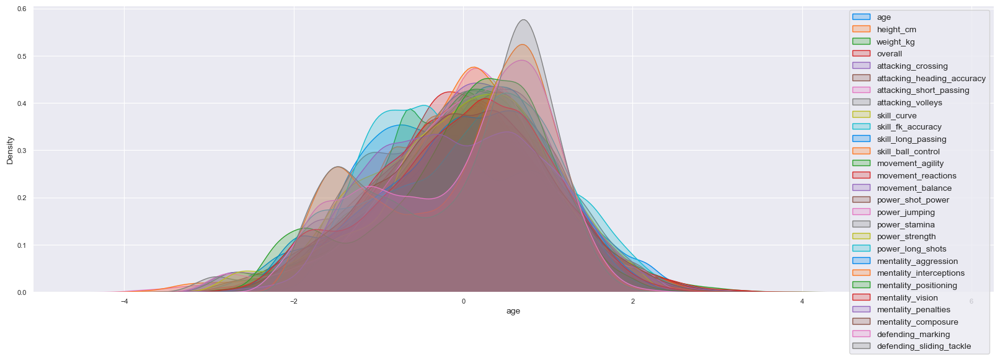

In [ ]:
plot_transformed_data(scaled_data)

* The data points are more spread out in this graph than they were in the previous graph. This suggests that the scaling has made the data more sensitive to changes in the variables.
* The outliers in the data are more pronounced in this graph than they were in the previous graph. This suggests that the scaling has made the outliers more visible.

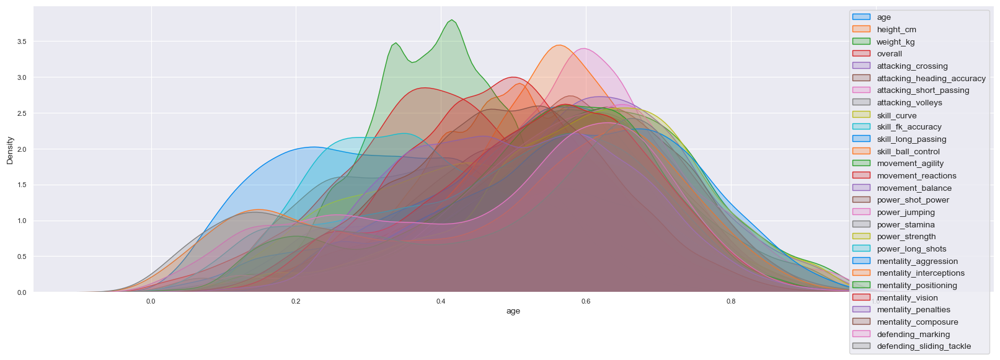

In [ ]:
plot_transformed_data(minmax_data)

* The data points are more evenly distributed in this graph than they were in the previous graphs. This suggests that the min-max normalization transformation has been effective in making the data more comparable.
* The outliers in the data are more pronounced in this graph than they were in the previous graphs. This suggests that the min-max normalization transformation has not been able to completely remove the impact of outliers on the data.

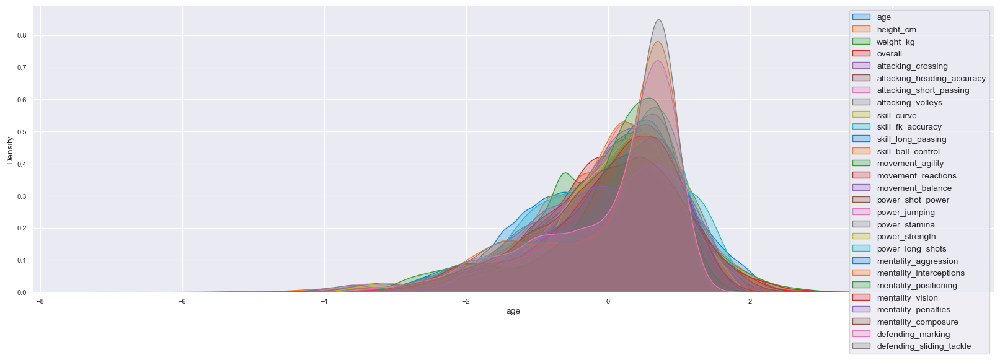

In [ ]:
plot_transformed_data(log_normal_data)

The outliers in the data are less pronounced in this graph than they were in the previous graphs. This suggests that the log-normal transformation has helped to reduce the impact of outliers on the data.

Total Variance Explained by the first 2 dimensions: 0.6854


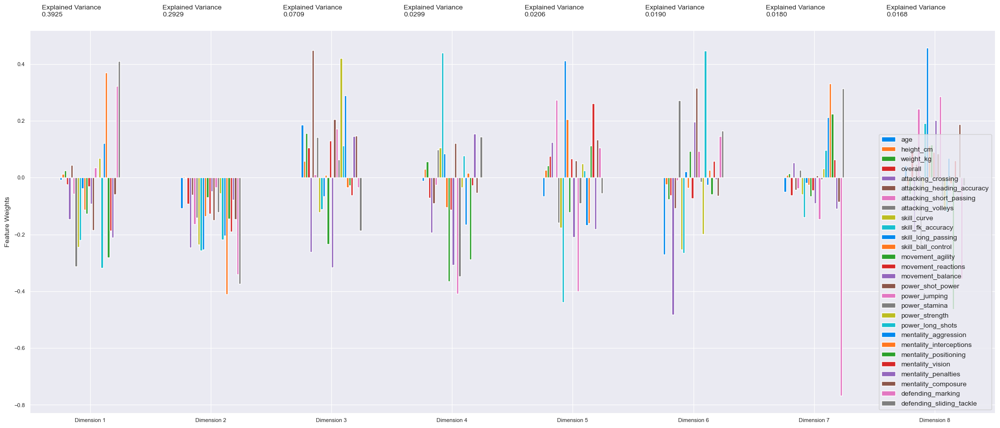

In [ ]:
pca_log = pca_results(log_data, 8)

Total Variance Explained by the first 2 dimensions: 0.5896


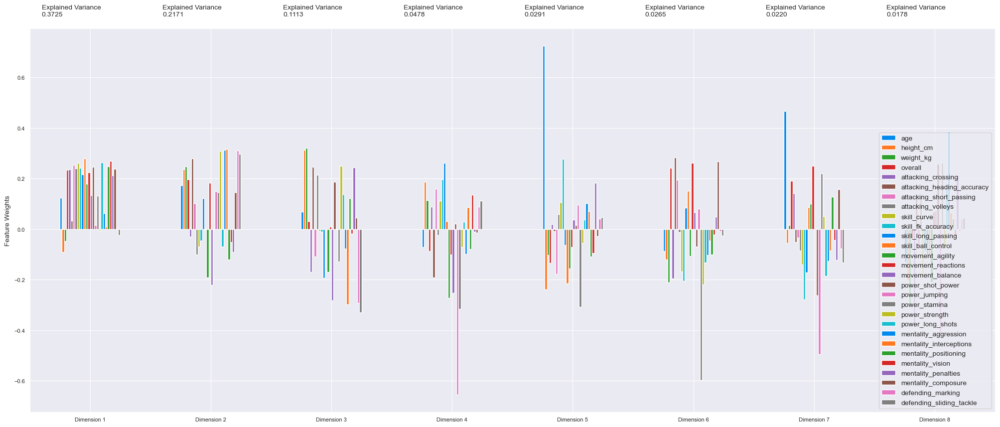

In [ ]:
pca_scaled = pca_results(scaled_data, 8)

Total Variance Explained by the first 2 dimensions: 0.6106


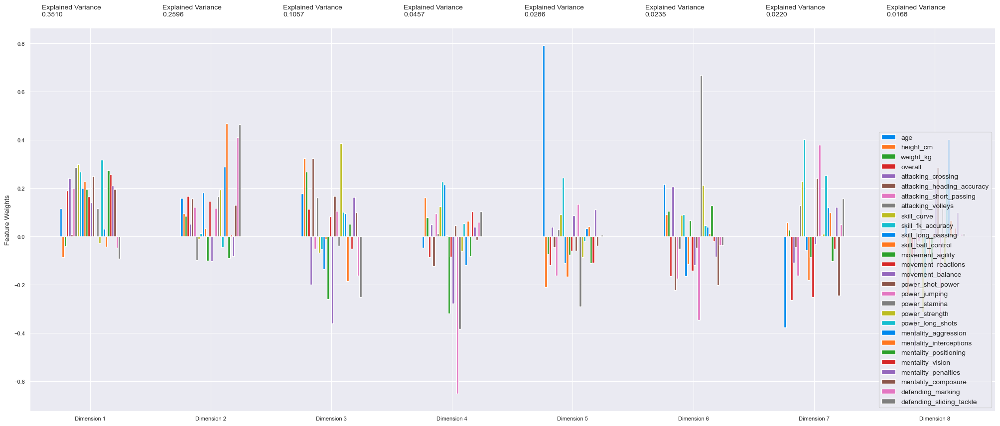

In [ ]:
pca_minmax = pca_results(minmax_data)

Total Variance Explained by the first 2 dimensions: 0.5697


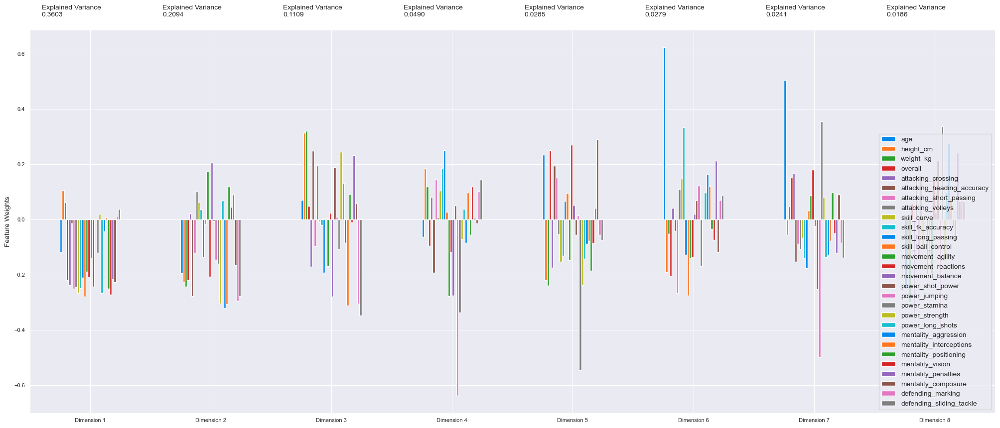

In [ ]:
pca_log_normal = pca_results(log_normal_data,8)

The scaling techniques and variance explained by the first two principal components are summarized in the table below:

| Scaling Technique | Variance explained by PC1 and PC2 |
|------|------|
|   Log Scaling	  |    68.4%    |
|   Standard Scaling  |    58.96%    |
|   Min Max Scaling  |    61.06%    |
|   Log normal Scaling  |    56.97%    |

The percentage of total variance explained by each principal component helps in understanding how much information each component retains.
* Log Scaling: The highest variance explained (68.4%) suggests that log-scaled data provides the best representation of the original data in the first two dimensions.
* Standard Scaling: The variance explained is (58.96%), indicating that standard-scaled data retains less variability than log scaling but still captures a significant amount.
* Min Max Scaling: The variance explained is (61.06%), suggesting that min-max scaled data performs well in the first two dimensions but slightly less than log scaling.
* Log Normal Scaling: The lowest variance explained (56.97%) implies that log-normal scaled data captures the least variability in the first two dimensions among the techniques tested.


# PCA Analysis

* When using principal component analysis, one of the main goals is to reduce the dimensionality of the data — in effect, reducing the complexity of the problem.    
* However, dimensionality reduction comes at a cost as fewer dimensions used implies less of the total variance in the data is being explained. Because of this, the cumulative explained variance ratio is extremely important for knowing how many dimensions are necessary for the problem. Additionally, if a significant amount of variance is explained by only two or three dimensions, the reduced data can be visualized afterwards.    
* Since PCs describe variation and account for the varied influences of the original characteristics, we can plot the PCs to find out which feature produces the differences among clusters.    
* To do this we plot the loadings, or vectors representing each feature of the PC plot centered at (0, 0) with the direction and length of these vectors showing how much significance each feature has on the PCs. Also, the angle between these vectors let us know correlation between the features with a small angle denoting high correlation. A plot that visualizes the above information is called a Biplot.


In [ ]:
def make_pca(data, sample_ids):
    pca = PCA(n_components=2).fit(data)
    reduced_data = pca.transform(log_data)
    pca_samples = pca.transform(log_data[log_data.index.isin(sample_ids)])
    reduced_data = pd.DataFrame(reduced_data, columns = ['Dimension 1', 'Dimension 2'])
    return pca, reduced_data, pca_samples


In [ ]:
def generate_samples(positions = ['CAM', 'RM', 'CDM', 'LM', 'CM'], n_samples = 10):
    '''
    positions = ['RW', 'ST', 'LW', 'GK', 'CAM', 'CB', 'CM', 'CDM', 'CF', 'LB', 'RB','RM', 'LM', 'LWB', 'RWB']
    '''
    samples = df[df.player_positions.isin(positions) & (df.overall>=70)].sample(n_samples)
    return samples.index.values

In [ ]:
pca, reduced_data, pca_samples = make_pca(log_data, sample_ids = generate_samples(['CAM','CM']))

In [ ]:
def biplot(log_data, reduced_data, pca):
    '''
    Produce a biplot that shows a scatterplot of the reduced
    data and the projections of the original features.

    good_data: original data, before transformation.
               Needs to be a pandas dataframe with valid column names
    reduced_data: the reduced data (the first two dimensions are plotted)
    pca: pca object that contains the components_ attribute
    return: a matplotlib AxesSubplot object (for any additional customization)

    This procedure is inspired by the script:
    https://github.com/teddyroland/python-biplot
    '''

    fig, ax = plt.subplots(figsize = (50,30))
    # scatterplot of the reduced data
    ax.scatter(x=reduced_data.loc[:, 'Dimension 1'], y=reduced_data.loc[:, 'Dimension 2'],
        facecolors='b', edgecolors='b', s=70, alpha=0.5)

    feature_vectors = pca.components_.T

    # we use scaling factors to make the arrows easier to see
    arrow_size, text_pos = 4.0, 4.7,

    # projections of the original features
    for i, v in enumerate(feature_vectors):
        ax.arrow(0, 0, arrow_size*v[0], arrow_size*v[1],
                  head_width=0.2, head_length=0.2, linewidth=2, color='red')
        ax.text(v[0]*text_pos, v[1]*text_pos, log_data.columns[i], color='black',
                 ha='center', va='center', fontsize=18)

    ax.set_xlabel("Dimension 1", fontsize=14)
    ax.set_ylabel("Dimension 2", fontsize=14)
    ax.set_title("PC plane with original feature projections.", fontsize=16);
    return ax


The Biplot for our dataset is provided below. As we can see, the features mentality_interceptions, defending_sliding_tackle and defending_marking is close together. Also, these strongly influence both PC1 and PC2.

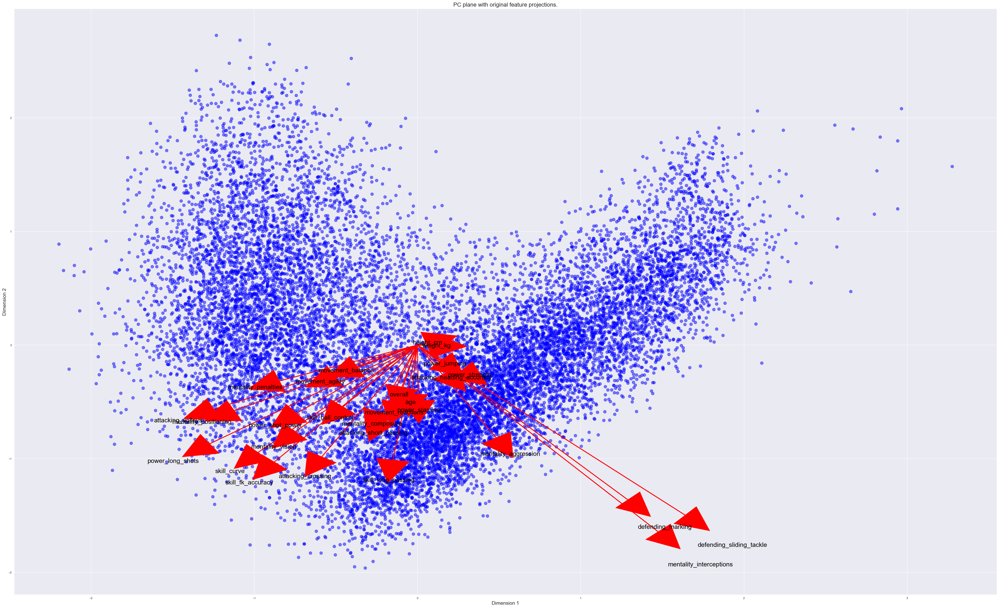

In [ ]:
biplot(log_data, reduced_data, pca);

* The image suggests that the two principal components are capturing different aspects of the data. Dimension 1 seems to be capturing the physical and offensive capabilities of the players, while Dimension 2 seems to be capturing the defensive and mental capabilities of the players.

* The image also suggests that there may be different clusters of players in the data. For example, there seems to be a cluster of players who are strong in both Dimension 1 and Dimension 2 (the upper-right corner of the graph). These players are likely to be well-rounded and have good stats in all areas.

* There also seems to be a cluster of players who are strong in Dimension 1 but weak in Dimension 2 (the upper-left corner of the graph). These players are likely to be offensive-minded and have good stats for shooting, passing, and dribbling.

* Finally, there seems to be a cluster of players who are strong in Dimension 2 but weak in Dimension 1 (the lower-right corner of the graph). These players are likely to be defensive-minded and have good stats for tackling, heading, and interceptions.

Overall, the image provides some insights into the distribution of the data and the potential for clustering. The PCA transformation has helped to reveal the underlying structure of the data and to make it easier to see the potential for different clusters.

# K-Means Clustering

+ In this section, we choose to use a K-Means clustering algorithm to identify the various player segments hidden in the data.   
+ Advantages of KMeans clustering algorithm are:
    * Kmeans is very fast.
    * Kmeans only needs to fit data to cluster centers. This makes KMeans faster in training.    
+ However, one drawback is that KMeans only assigns hard clusters and does not give the probability score of the cluster.     

Based on the data, it seems KMeans would do a good job assuming that the players are well segmented, and each player assumes a special role.    

- Depending on the problem, the number of clusters in the data may not be known in advance. As a result, we do not know for sure if a certain number of clusters are the best choice for our data. Since we do not know the structure present in the data, in order to measure the “goodness” of our clustering, we calculate each point’s **silhouette coefficient.**    

- The silhouette coefficient for a data point measures how similar it is to its assigned cluster from -1 (dissimilar) to 1 (similar). Calculating the mean silhouette coefficient provides for a simple scoring method of a given clustering.    

- The Silhouette Coefficient is defined for each sample and is composed of two scores (a and b):
    a.The mean distance between a sample and all other points in the same class.
    b.The mean distance between a sample and all other points in the next nearest cluster.    

The Silhouette Coefficient s for a single sample is then given as:

$$ s = \frac{b-a}{max(a, b)}$$


The Silhouette Coefficient for a set of samples is given as the mean of the Silhouette Coefficient for each sample. In our analysis, we receive the highest Silhouette Score of about `0.53` for three clusters. Another popular method to guess the appropriate number of clusters is the **Elbow Method**. In this method, we choose that value of `K`, which lies at the elbow of the curve plotted between the number of clusters and sum of distances between each point and its centroid. As we can see from the image below, the elbow of the curve appears at 3 clusters thus concurring with the Silhouette score.

In [ ]:
from sklearn.metrics import silhouette_score
from sklearn.cluster import KMeans

def cluster(reduced_data,n_clusters,pca_samples=pca_samples):
    clusterer = KMeans(n_clusters=n_clusters, random_state=123).fit(reduced_data)
    preds = clusterer.predict(reduced_data)
    centers = clusterer.cluster_centers_
    sample_preds = clusterer.predict(pca_samples)
    return preds, centers, sample_preds

def silhouette_scorer(reduced_data,n_clusters):
    preds,_,_ = cluster(reduced_data,n_clusters)
    score = silhouette_score(reduced_data, preds)
    return score

for n_clusters in range(2,10):
    score = silhouette_scorer(reduced_data,n_clusters)
    print ("Silhoutte Score for {} clusters is {}".format(n_clusters,score))


Silhoutte Score for 2 clusters is 0.41782907774395545
Silhoutte Score for 3 clusters is 0.45743281481253406
Silhoutte Score for 4 clusters is 0.4204260431665266
Silhoutte Score for 5 clusters is 0.4014653861897989
Silhoutte Score for 6 clusters is 0.3659526684627094
Silhoutte Score for 7 clusters is 0.3517632762082909
Silhoutte Score for 8 clusters is 0.36477218024758445
Silhoutte Score for 9 clusters is 0.3436163230532228


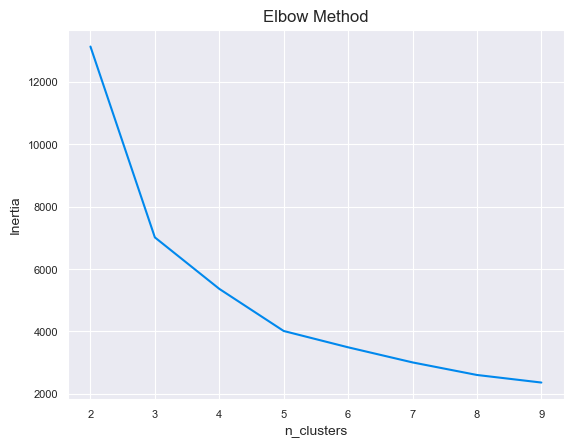

In [ ]:
inertia = []
clusters = range(2,10)
for n_clusters in clusters:
    clusterer = KMeans(n_clusters=n_clusters, random_state=123).fit(reduced_data)
    preds = clusterer.predict(reduced_data)
    inertia.append(clusterer.inertia_)

plt.plot(clusters, inertia)
plt.ylabel('Inertia')
plt.xlabel('n_clusters')
plt.title('Elbow Method');


**So we get three clusters.**

In [ ]:
def cluster_results(reduced_data, preds, centers, pca_samples):
    '''
    Visualizes the PCA-reduced cluster data in two dimensions
    Adds cues for cluster centers and student-selected sample data
    '''
    import matplotlib.cm as cm
    predictions = pd.DataFrame(preds, columns = ['Cluster'])
    plot_data = pd.concat([predictions, reduced_data], axis = 1)

    # Generate the cluster plot
    fig, ax = plt.subplots(figsize = (14,8))

    # Color map
    cmap = cm.get_cmap('gist_rainbow')

    # Color the points based on assigned cluster
    for i, cluster in plot_data.groupby('Cluster'):
        cluster.plot(ax = ax, kind = 'scatter', x = 'Dimension 1', y = 'Dimension 2', \
                     color = cmap((i)*1.0/(len(centers)-1)), label = 'Cluster %i'%(i), s=30);

    # Plot centers with indicators
    for i, c in enumerate(centers):
        ax.scatter(x = c[0], y = c[1], color = 'white', edgecolors = 'black', \
                   alpha = 1, linewidth = 2, marker = 'o', s=200);
        ax.scatter(x = c[0], y = c[1], marker='$%d$'%(i), alpha = 1, s=100);

    # Plot transformed sample points
    ax.scatter(x = pca_samples[:,0], y = pca_samples[:,1], \
               s = 150, linewidth = 4, color = 'black', marker = 'x');

    # Set plot title
    ax.set_title("Cluster Learning on PCA-Reduced Data - Centroids Marked by Number\nTransformed Sample Data Marked by Black Cross");

In [ ]:
# positions = df.player_positions.unique()
# unique_positions = set(positions)
# unique_positions

## General observations for the below 3 outputs

* Cluster Separation: It helps to understand how well the clustering algorithm has separated the data points into distinct clusters in the reduced PCA space. Each cluster is represented by a unique color.

* Cluster Centers: The white circles with black edges indicate the cluster centers. The labeled numbers in these circles correspond to the cluster number. This gives an idea of where the center of each cluster lies in the PCA space.

* Sample Data Representation: The black crosses ("x") represent the transformed sample data points from PCA space. These points can give an idea of how the clustering algorithm assigns these samples to clusters.

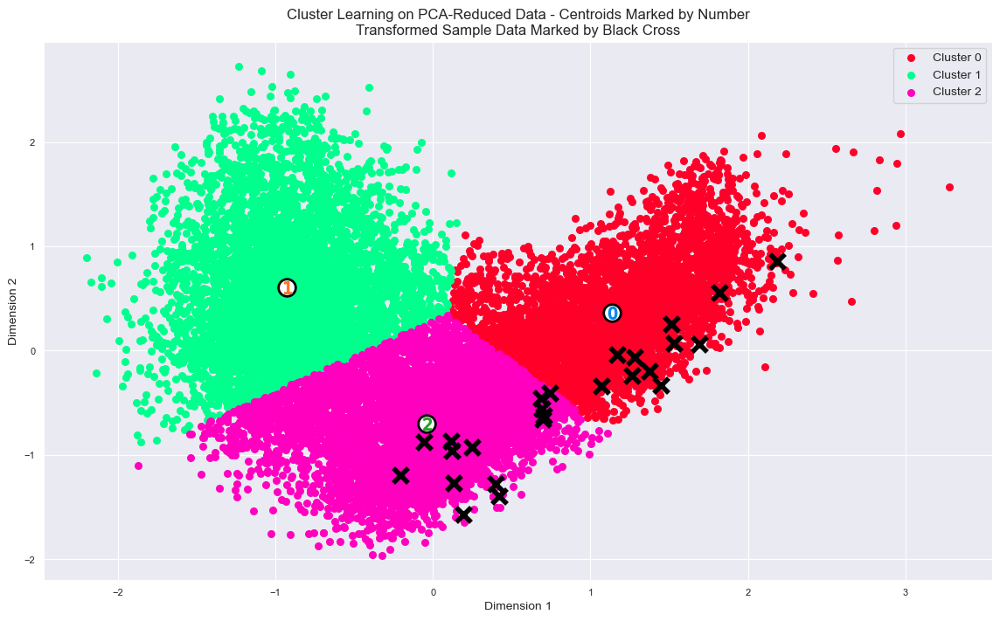

In [ ]:
sample_ids = generate_samples(['CB','LB','RB'], 25)

_, _, pca_samples = make_pca(log_data, sample_ids)
preds, centers, sample_preds = cluster(reduced_data, 3)
cluster_results(reduced_data, preds, centers, pca_samples)

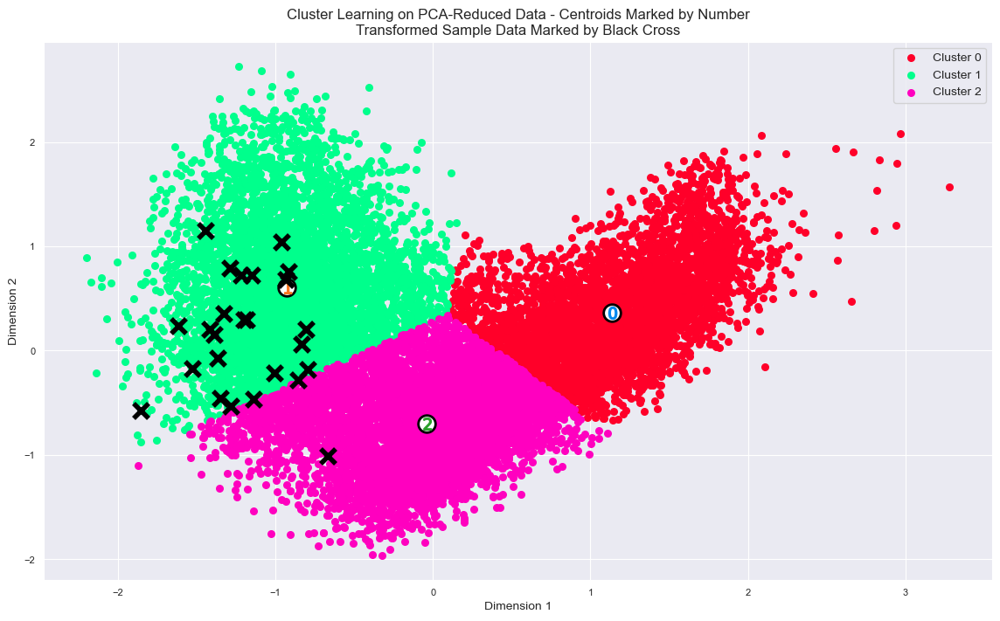

In [ ]:
sample_ids = generate_samples(['ST','CF'], 25)

_, _, pca_samples = make_pca(log_data, sample_ids)
preds, centers, sample_preds = cluster(reduced_data, 3)
cluster_results(reduced_data, preds, centers, pca_samples)

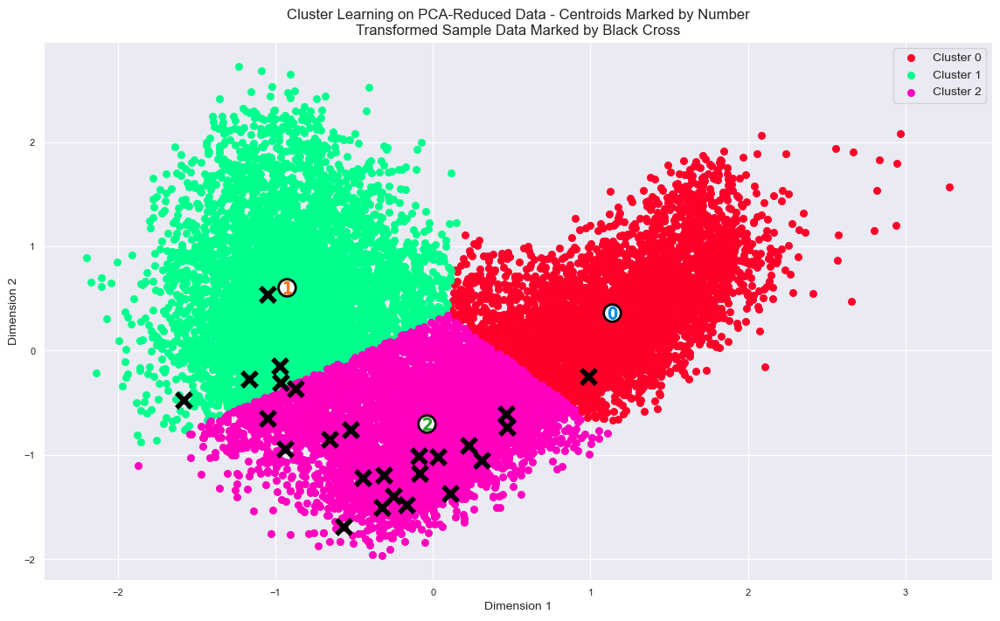

In [ ]:
sample_ids = generate_samples(['CM','RM','LM','CAM','CDM'], 25)

_, _, pca_samples = make_pca(log_data, sample_ids)
preds, centers, sample_preds = cluster(reduced_data, 3)
cluster_results(reduced_data, preds, centers, pca_samples)

## Results:

From the analysis, it's evident that the K-means clustering has successfully separated the players into three distinct clusters based on their primary playing positions in the game:

- Cluster 0 (Red): Defenders
- Cluster 1 (Green): Forwards
- Cluster 2 (Pink): Midfielders

1. Goalkeeper
2. Defender: - [LB, LCB, CB, RCB, RB, LWB, RWB]
3. Midfielder: - [LAM, CAM, RAM, LM, LCM, CM, RCM, RM, LDM, CDM, RDM]
4. Forwards: - [LS, ST, RS, LW, LF, CF, RF, RW]

![FIFA 20](https://www.fifauteam.com/wp-content/uploads/2012/08/A046-1.jpg)

## Interpretation:

To understand why K-means arrived at these clusters, let's refer back to the Biplot visualization:

1. **Cluster 0 (Defenders - Red):**
   - In this cluster, features like `defending_marking`, `mentality_interceptions`, and `defending_sliding_tackle` have a strong influence. These features are associated with defensive skills, indicating that the players in this cluster excel in defending aspects of the game. This aligns with our inference that Cluster 0 represents defenders.

2. **Cluster 1 (Forwards - Green):**
   - The key features that contribute to this cluster are `attacking`, `volleys`, `mentality_positioning`, and `attacking_header_accuracy`. These features are related to goal-scoring abilities and positioning. Players in this cluster are likely forwards, as they possess the attributes necessary for scoring goals.

3. **Cluster 2 (Midfielders - Pink):**
   - This cluster is defined by features like `skill_long_passing`, `short_passing`, `power_stamina`, and `mental_composure`. These attributes are commonly associated with midfielders who play a crucial role in controlling the game's tempo, passing, and maintaining possession.

## Linking Clusters to Playing Positions:

By comparing the feature vectors' directions with the directions of the clusters, the interpretation becomes more apparent:

- **Defenders (Cluster 0)**: The features align with strong defensive traits, confirming that this cluster represents defenders who excel in marking, interceptions, and sliding tackles.

- **Forwards (Cluster 1)**: The cluster is characterized by features that suggest effective goal-scoring abilities and positioning, fitting the profile of forwards.

- **Midfielders (Cluster 2)**: The cluster is marked by attributes that are essential for midfielders' roles, including passing skills, stamina, and mental composure.

## Practical Insights:

This analysis provides valuable insights into player roles and strengths. For instance:

- **Player Role Identification**: By understanding the dominant features in each cluster, you can identify players' potential roles more accurately. For instance, the "midfielders" cluster can be used to identify strong midfield candidates.

- **Scouting and Recruitment**: Teams can use this information for scouting and recruitment, as it helps to identify players who fit specific playing positions and team strategies.

- **Player Development**: The analysis can aid in player development by highlighting areas of strength and improvement for players in different clusters.

In summary, the combination of K-means clustering and PCA with a Biplot visualization allows for a comprehensive understanding of player roles and attributes, facilitating better decision-making in team management and player selection.

# PowerBI report

**Representing the above obtained results in Microsoft PowerBI through an interactive dashboard.**

In [ ]:
target_values = ['GK','gk']

def contains_target_value(row):
    return any(val in row.values for val in target_values)

mask = df.apply(contains_target_value, axis=1)
goalkeeper_df = df[mask]
goalkeeper_df

,sofifa_id,player_url,short_name,long_name,age,dob,height_cm,weight_kg,nationality,club,overall,potential,value_eur,wage_eur,player_positions,preferred_foot,international_reputation,weak_foot,skill_moves,work_rate,body_type,real_face,release_clause_eur,player_tags,team_position,team_jersey_number,loaned_from,joined,contract_valid_until,nation_position,nation_jersey_number,pace,shooting,passing,dribbling,defending,physic,gk_diving,gk_handling,gk_kicking,gk_reflexes,gk_speed,gk_positioning,player_traits,attacking_crossing,attacking_finishing,attacking_heading_accuracy,attacking_short_passing,attacking_volleys,skill_dribbling,skill_curve,skill_fk_accuracy,skill_long_passing,skill_ball_control,movement_acceleration,movement_sprint_speed,movement_agility,movement_reactions,movement_balance,power_shot_power,power_jumping,power_stamina,power_strength,power_long_shots,mentality_aggression,mentality_interceptions,mentality_positioning,mentality_vision,mentality_penalties,mentality_composure,defending_marking,defending_standing_tackle,defending_sliding_tackle,goalkeeping_diving,goalkeeping_handling,goalkeeping_kicking,goalkeeping_positioning,goalkeeping_reflexes,ls,st,rs,lw,lf,cf,rf,rw,lam,cam,ram,lm,lcm,cm,rcm,rm,lwb,ldm,cdm,rdm,rwb,lb,lcb,cb,rcb,rb
3,3781,https://sofifa.com/player/200389/jan-oblak/20/...,J. Oblak,Jan Oblak,26,1993-01-07,188,87,Slovenia,Atlético Madrid,91,93,-29088,-6072,GK,Right,3,3,1,Medium/Medium,Normal,Yes,164700000.0,NaN,GK,13.0,NaN,2014-07-16,2023.0,GK,1.0,NaN,NaN,NaN,NaN,NaN,NaN,87.0,92.0,78.0,89.0,52.0,90.0,"Flair, Acrobatic Clearance",13,11,15,43,13,12,13,14,40,30,43,60,67,88,49,59,78,41,78,12,34,19,11,65,11,68,27,12,18,87,92,78,90,89,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,-1.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
6,-4160,https://sofifa.com/player/192448/marc-andre-te...,M. ter Stegen,Marc-André ter Stegen,27,1992-04-30,187,85,Germany,FC Barcelona,90,93,-2080,-12144,GK,Right,3,4,1,Medium/Medium,Normal,Yes,143400000.0,NaN,GK,1.0,NaN,2014-07-01,2022.0,SUB,22.0,NaN,NaN,NaN,NaN,NaN,NaN,88.0,85.0,88.0,90.0,45.0,88.0,"Swerve Pass, Acrobatic Clearance, Flair Passes",18,14,11,61,14,21,18,12,63,30,38,50,37,86,43,66,79,35,78,10,43,22,11,70,25,70,25,13,10,88,85,88,88,90,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,-1.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
13,16223,https://sofifa.com/player/212831/alisson-ramse...,Alisson,Alisson Ramses Becker,26,1992-10-02,191,91,Brazil,Liverpool,89,91,640,23928,GK,Right,3,3,1,Medium/Medium,Normal,Yes,111700000.0,NaN,GK,1.0,NaN,2018-07-19,2024.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,85.0,84.0,85.0,89.0,51.0,90.0,"Flair, Swerve Pass",17,13,19,45,20,27,19,18,44,30,56,47,40,88,37,64,52,32,78,14,27,11,13,66,23,65,15,19,16,85,84,85,90,89,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,-1.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
14,-3528,https://sofifa.com/player/193080/david-de-gea-...,De Gea,David De Gea Quintana,28,1990-11-07,192,82,Spain,Manchester United,89,90,32256,8392,GK,Right,4,3,1,Medium/Medium,Lean,Yes,110600000.0,NaN,GK,1.0,NaN,2011-07-01,2020.0,GK,1.0,NaN,NaN,NaN,NaN,NaN,NaN,90.0,84.0,81.0,92.0,58.0,85.0,"Flair, Second Wind, Flair Passes",17,13,21,50,13,18,21,19,47,38,57,58,63,87,43,61,67,43,60,12,38,30,12,65,29,68,25,21,13,90,84,81,85,92,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,-1.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
25,13649,https://sofifa.com/player/210257/ederson-santa...,Ederson,Ederson Santana de Moraes,25,1993-08-17,188,86,Brazil,Manchester City,88,91,-25952,-11608,GK,Left,2,3,1,Medium/Medium,Normal,Yes,104900000.0,NaN,GK,31.0,NaN,2017-07-01,2024.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,86.0,82.0,93.0,88.0,63.0,86.0,"Leadership, Swerve Pass, Acrobatic Clearance",20,14,14,56,18,23,15,20,58,40,64,63,60,87,48,70,66,41,68,18,38,27,20,70,17,70,29,15,8,86,82,93,86,88,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,-1.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,.

In [ ]:
excel_filename_gk = 'goalkeeper_dataset.xlsx'

# Convert DataFrame to Excel
goalkeeper_df.to_excel(excel_filename_gk, index=False)


In [ ]:
target_values = ['lb', 'lcb', 'cb', 'rcb', 'rb', 'lwb', 'rwb', 'LB', 'LCB', 'CB', 'RCB', 'RB', 'LWB', 'RWB']

def contains_target_value(row):
    return any(val in row.values for val in target_values)

mask = df.apply(contains_target_value, axis=1)
defender_df = df[mask]
defender_df

,sofifa_id,player_url,short_name,long_name,age,dob,height_cm,weight_kg,nationality,club,overall,potential,value_eur,wage_eur,player_positions,preferred_foot,international_reputation,weak_foot,skill_moves,work_rate,body_type,real_face,release_clause_eur,player_tags,team_position,team_jersey_number,loaned_from,joined,contract_valid_until,nation_position,nation_jersey_number,pace,shooting,passing,dribbling,defending,physic,gk_diving,gk_handling,gk_kicking,gk_reflexes,gk_speed,gk_positioning,player_traits,attacking_crossing,attacking_finishing,attacking_heading_accuracy,attacking_short_passing,attacking_volleys,skill_dribbling,skill_curve,skill_fk_accuracy,skill_long_passing,skill_ball_control,movement_acceleration,movement_sprint_speed,movement_agility,movement_reactions,movement_balance,power_shot_power,power_jumping,power_stamina,power_strength,power_long_shots,mentality_aggression,mentality_interceptions,mentality_positioning,mentality_vision,mentality_penalties,mentality_composure,defending_marking,defending_standing_tackle,defending_sliding_tackle,goalkeeping_diving,goalkeeping_handling,goalkeeping_kicking,goalkeeping_positioning,goalkeeping_reflexes,ls,st,rs,lw,lf,cf,rf,rw,lam,cam,ram,lm,lcm,cm,rcm,rm,lwb,ldm,cdm,rdm,rwb,lb,lcb,cb,rcb,rb
7,6768,https://sofifa.com/player/203376/virgil-van-di...,V. van Dijk,Virgil van Dijk,27,1991-07-08,193,92,Netherlands,Liverpool,90,91,12160,3392,CB,Right,3,3,2,Medium/Medium,Normal,Yes,150200000.0,"#Tackling , #Tactician , #Strength, #Complete ...",LCB,4.0,NaN,2018-01-01,2023.0,LCB,4.0,77.0,60.0,70.0,71.0,90.0,86.0,NaN,NaN,NaN,NaN,NaN,NaN,"Diver, Avoids Using Weaker Foot, Leadership, L...",53,52,86,78,45,70,60,70,81,76,74,79,61,88,53,81,90,75,92,64,82,89,47,65,62,89,91,92,85,13,10,13,11,11,72.0,72.0,72.0,70.0,72.0,72.0,72.0,70.0,72.0,72.0,72.0,72.0,77.0,77.0,77.0,72.0,82.0,86.0,86.0,86.0,82.0,84.0,90.0,90.0,90.0,84.0
11,4416,https://sofifa.com/player/201024/kalidou-kouli...,K. Koulibaly,Kalidou Koulibaly,28,1991-06-20,187,89,Senegal,Napoli,89,91,-2080,18928,CB,Right,3,3,2,Medium/High,Normal,Yes,119800000.0,"#Tackling , #Tactician , #Strength, #Complete ...",LCB,26.0,NaN,2014-07-01,2021.0,NaN,NaN,71.0,28.0,54.0,67.0,89.0,87.0,NaN,NaN,NaN,NaN,NaN,NaN,Long Passer (CPU AI Only),30,22,83,71,14,69,28,28,63,71,69,73,52,86,41,55,81,73,95,15,87,88,35,52,33,82,91,90,87,7,11,7,13,5,59.0,59.0,59.0,58.0,60.0,60.0,60.0,58.0,61.0,61.0,61.0,63.0,68.0,68.0,68.0,63.0,77.0,82.0,82.0,82.0,77.0,80.0,89.0,89.0,89.0,80.0
16,7884,https://sofifa.com/player/138956/giorgio-chiel...,G. Chiellini,Giorgio Chiellini,34,1984-08-14,187,85,Italy,Juventus,89,89,-10464,18392,CB,Left,4,3,2,Medium/High,Normal,Yes,40400000.0,"#Tackling , #Tactician , #Strength, #Complete ...",LCB,3.0,NaN,2005-07-01,2020.0,LCB,3.0,68.0,46.0,58.0,60.0,90.0,82.0,NaN,NaN,NaN,NaN,NaN,NaN,"Inflexible, Power Free-Kick, Injury Prone, Lon...",54,33,83,65,45,59,60,31,65,61,61,73,57,82,57,78,89,59,89,49,91,88,28,50,50,84,94,91,89,3,3,2,4,3,61.0,61.0,61.0,58.0,59.0,59.0,59.0,58.0,59.0,59.0,59.0,60.0,65.0,65.0,65.0,60.0,76.0,80.0,80.0,80.0,76.0,79.0,89.0,89.0,89.0,79.0
18,24790,https://sofifa.com/player/155862/sergio-ramos-...,Sergio Ramos,Sergio Ramos García,33,1986-03-30,184,82,Spain,Real Madrid,89,89,-22816,-27680,CB,Right,4,3,3,High/Medium,Normal,Yes,64600000.0,"#Aerial Threat, #Tackling , #Tactician , #Comp...",LCB,4.0,NaN,2005-08-01,2020.0,RCB,15.0,72.0,68.0,75.0,73.0,87.0,85.0,NaN,NaN,NaN,NaN,NaN,NaN,"Injury Prone, Avoids Using Weaker Foot, Leader...",66,63,92,80,69,65,74,72,83,83,74,71,78,87,66,79,93,80,85,62,90,88,67,71,86,84,85,87,90,11,8,9,7,11,77.0,77.0,77.0,75.0,76.0,76.0,76.0,75.0,77.0,77.0,77.0,76.0,81.0,81.0,81.0,76.0,83.0,87.0,87.0,87.0,83.0,85.0,90.0,90.0,90.0,85.0
29,21657,https://sofifa.com/player/152729/gerard-pique-...,Piqué,Gerard Piqué Bernabéu,32,1987-02-02,194,85,Spain,FC Barcelona,88,88,-10880,22856,CB,Right,4,3,2,High/Medium,Normal,Yes,77900000.0,"#Aerial Threat, #Tackling , #Tactician , #Stre...",RCB,3.0,NaN,2008-07-01,2022.0,NaN

In [ ]:
excel_filename_df = 'defender_dataset.xlsx'

# Convert DataFrame to Excel
defender_df.to_excel(excel_filename_df, index=False)

In [ ]:
target_values = ['lam','cam','ram','lm','lcm','cm','rcm','rm','ldm','cdm','rdm','LAM','CAM','RAM','LM','LCM','CM','RCM','RM','LDM','CDM','RDM']

def contains_target_value(row):
    return any(val in row.values for val in target_values)

mask = df.apply(contains_target_value, axis=1)
midfielder_df = df[mask]
midfielder_df.sample()

,sofifa_id,player_url,short_name,long_name,age,dob,height_cm,weight_kg,nationality,club,overall,potential,value_eur,wage_eur,player_positions,preferred_foot,international_reputation,weak_foot,skill_moves,work_rate,body_type,real_face,release_clause_eur,player_tags,team_position,team_jersey_number,loaned_from,joined,contract_valid_until,nation_position,nation_jersey_number,pace,shooting,passing,dribbling,defending,physic,gk_diving,gk_handling,gk_kicking,gk_reflexes,gk_speed,gk_positioning,player_traits,attacking_crossing,attacking_finishing,attacking_heading_accuracy,attacking_short_passing,attacking_volleys,skill_dribbling,skill_curve,skill_fk_accuracy,skill_long_passing,skill_ball_control,movement_acceleration,movement_sprint_speed,movement_agility,movement_reactions,movement_balance,power_shot_power,power_jumping,power_stamina,power_strength,power_long_shots,mentality_aggression,mentality_interceptions,mentality_positioning,mentality_vision,mentality_penalties,mentality_composure,defending_marking,defending_standing_tackle,defending_sliding_tackle,goalkeeping_diving,goalkeeping_handling,goalkeeping_kicking,goalkeeping_positioning,goalkeeping_reflexes,ls,st,rs,lw,lf,cf,rf,rw,lam,cam,ram,lm,lcm,cm,rcm,rm,lwb,ldm,cdm,rdm,rwb,lb,lcb,cb,rcb,rb
12170,-15550,https://sofifa.com/player/246594/han-noah-mass...,H. Massengo,Han-Noah Massengo,17,2001-07-07,177,66,France,Bristol City,63,83,19640,1000,CDM,Right,1,3,2,Medium/Medium,Lean,No,2000000.0,NaN,SUB,42.0,NaN,2019-08-05,2023.0,NaN,NaN,69.0,47.0,59.0,62.0,61.0,62.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,53,39,60,66,39,60,46,44,62,64,68,69,59,60,76,58,61,61,61,52,64,63,57,57,51,60,57,63,65,8,14,12,9,15,58.0,58.0,58.0,60.0,60.0,60.0,60.0,60.0,61.0,61.0,61.0,62.0,62.0,62.0,62.0,62.0,63.0,64.0,64.0,64.0,63.0,64.0,64.0,64.0,64.0,64.0


In [ ]:
excel_filename_mf = 'midfielder_dataset.xlsx'

# Convert DataFrame to Excel
midfielder_df.to_excel(excel_filename_mf, index=False)

In [ ]:
target_values = ['ls', 'st', 'rs', 'lw', 'lf', 'cf', 'rf', 'rw','LS','ST','RS','LW','LF','CF','RF','RW']

def contains_target_value(row):
    return any(val in row.values for val in target_values)

mask = df.apply(contains_target_value, axis=1)
forwards_df = df[mask]
forwards_df.sample()

,sofifa_id,player_url,short_name,long_name,age,dob,height_cm,weight_kg,nationality,club,overall,potential,value_eur,wage_eur,player_positions,preferred_foot,international_reputation,weak_foot,skill_moves,work_rate,body_type,real_face,release_clause_eur,player_tags,team_position,team_jersey_number,loaned_from,joined,contract_valid_until,nation_position,nation_jersey_number,pace,shooting,passing,dribbling,defending,physic,gk_diving,gk_handling,gk_kicking,gk_reflexes,gk_speed,gk_positioning,player_traits,attacking_crossing,attacking_finishing,attacking_heading_accuracy,attacking_short_passing,attacking_volleys,skill_dribbling,skill_curve,skill_fk_accuracy,skill_long_passing,skill_ball_control,movement_acceleration,movement_sprint_speed,movement_agility,movement_reactions,movement_balance,power_shot_power,power_jumping,power_stamina,power_strength,power_long_shots,mentality_aggression,mentality_interceptions,mentality_positioning,mentality_vision,mentality_penalties,mentality_composure,defending_marking,defending_standing_tackle,defending_sliding_tackle,goalkeeping_diving,goalkeeping_handling,goalkeeping_kicking,goalkeeping_positioning,goalkeeping_reflexes,ls,st,rs,lw,lf,cf,rf,rw,lam,cam,ram,lm,lcm,cm,rcm,rm,lwb,ldm,cdm,rdm,rwb,lb,lcb,cb,rcb,rb
16803,-14252,https://sofifa.com/player/247892/andre-alsanat...,A. Alsanati,André Alsanati,19,2000-01-06,164,60,Sweden,Hammarby IF,56,71,-6608,1000,RW,Left,1,3,2,Medium/Medium,Normal,No,356000.0,NaN,SUB,29.0,NaN,2019-01-01,2020.0,NaN,NaN,64.0,50.0,55.0,59.0,23.0,51.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,54,52,29,56,42,59,44,36,54,58,65,64,66,36,76,54,58,54,54,43,40,21,59,60,51,56,19,25,23,9,6,8,15,9,53.0,53.0,53.0,58.0,56.0,56.0,56.0,58.0,58.0,58.0,58.0,58.0,53.0,53.0,53.0,58.0,44.0,42.0,42.0,42.0,44.0,40.0,34.0,34.0,34.0,40.0


In [ ]:
excel_filename_fw = 'forwards_dataset.xlsx'

# Convert DataFrame to Excel
forwards_df.to_excel(excel_filename_fw, index=False)

## Click on the link below to download the Power BI interactive dashboard.

[Download Power BI Report](./FIFA_powerbi.pbix)